In [40]:
import numpy as np # scientific computing 
import scipy.io
from scipy import stats 
import pandas as pd # data manipulation 
from sklearn.cross_validation import LeaveOneLabelOut
from sklearn.cross_validation import cross_val_score
from sklearn import linear_model
from sklearn import svm 
from sklearn.neighbors import KNeighborsClassifier
import brainiak.funcalign.srm
from sklearn.naive_bayes import GaussianNB
from brainiak import image, io
import matplotlib.pyplot as plt
%matplotlib inline 
import time

# useful variables
nScenes = 50
nScenes1 = 27
nTRs1 = 946 
nScenes2 = 23
nTRs2 = 1030
n = 17

In [2]:
# for each participant (of 17), let's get the recall data for each of 50 scenes
# recalled (1/0), quality (0 if not recalled, else 1-5, 5), recall time len
recall_dfs = []
recall_path = "SherlockData/recall_transcripts/"
for pid in range(1, 18):
    filename = "NN_S" + str(pid) + "_Scene_Matches_edit4matlab.xlsx"
    file = pd.read_excel(recall_path + filename)
    file = file.replace(np.nan, -1, regex=True)
    quality = []
    recalled = []
    duration = []
    for s in range(50):
        if file['quality'][s] == -1: # did not recall
            quality.append(0)
            recalled.append(0)
            duration.append(0)
        else:
            quality.append(file['quality'][s])
            recalled.append(1)
            duration.append(file['end time sec'][s] - file['start time sec'][s])
    recall_dfs.append(np.transpose([recalled, quality, duration]))
recall_dfs = np.array(recall_dfs)

# Load in the brain data: 17 participants, 26k WB mask voxels, 1976 TRs
movie_data = []
for pid in range(1, 18):
    moviedat = np.load("SherlockData/movie_masked/movie_wb_S" + str(pid) + ".npz")['data']
    # stored as TR x voxel, but we want voxel x TR data 
    movie_data.append(np.transpose(moviedat))
movie_data = np.array(movie_data)

movieTRs = np.array(pd.read_csv("movieTRs.csv", index_col = 0))

# zscores a list of 2D arrays, by row
def zscore(data):
    for pid in range(len(data)):
        data[pid] = np.nan_to_num(stats.zscore(data[pid], axis = 1, ddof = 1))
    return np.array(data)

# Loading in data describing movie features 
features = pd.read_csv("features.csv", index_col = 0) 

# Downsampling function:
# given data matrix of 1 participant (features x TRs)
# returns a features x SCENEs matrix, where 
# corresponding TRs in a scene are averaged 
def scene_voxelavg(dat_tr, startind = 0, endind = nScenes, rh = False):
    dat_sc = []
    for sceneidx in range(startind, endind):
        offset = 1
        if rh:
            offset = offset + nTRs1
        startTR = movieTRs[sceneidx, 1] - offset
        endTR = movieTRs[sceneidx, 2] - offset
        response_avg = np.reshape(np.mean(dat_tr[:,startTR:endTR + 1], axis = 1), (-1, 1))
        if len(dat_sc) == 0:
            dat_sc = response_avg
        else:
            dat_sc = np.append(dat_sc, response_avg, axis = 1)
    return np.array(dat_sc)

# Given a feature name (string), returns nTRs-len vector of features
def expandFeature(feat):
    ret = []
    curScene = 0
    for i in range(movie_data.shape[2]): # for each TR 
        if (features.fillna(946)).loc[curScene, 'end_TR'] <= i:
            curScene = curScene + 1
        ret.append(features.loc[curScene, feat])
    return np.array(ret)

In [3]:
# Let's get participants' feature matrices 

featmats = []
for pid in range(n):
    mat1 = np.load("FeaturePredictions/featmat" + str(pid) + ".npz")["data"]
    mat2 = np.load("FeaturePredictions/featmat" + str(pid) + "_2.npz")["data"]
    wbmat = np.append(mat1, mat2, axis = 1)
    featmats.append(wbmat)
featmats = np.array(featmats)

np.shape(featmats)

featmats_sc = np.array([scene_voxelavg(featmats[i], 0) for i in range(n)])
# feature predictions, except by scene instead of TR (n x nfeatures x 50)

# categorical variables should be binary coded 
featmats_sc[:, 4:14, :] = np.round(featmats_sc[:, 4:14, :])

In [4]:
recalled = recall_dfs[:, :, 0] # 17 x 50 

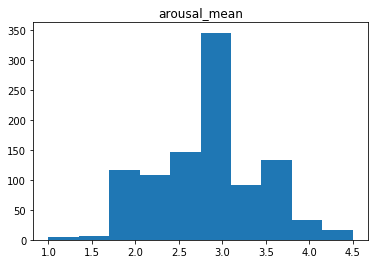

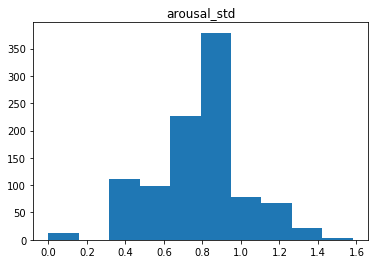

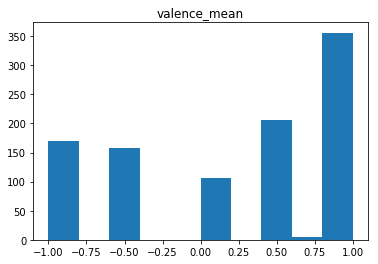

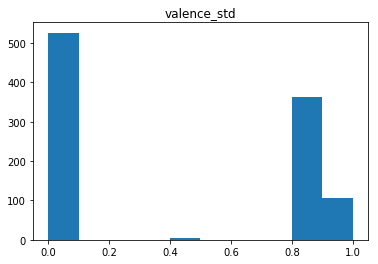

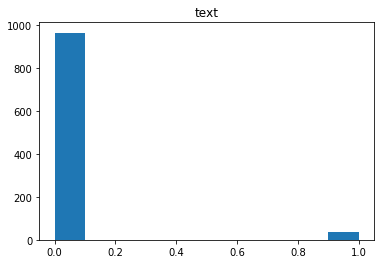

...

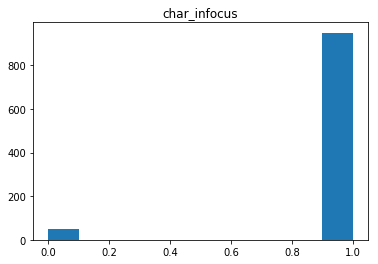

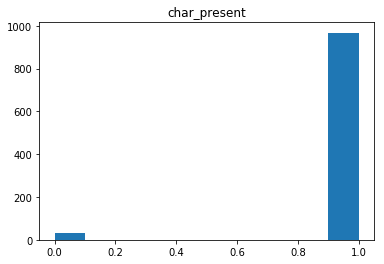

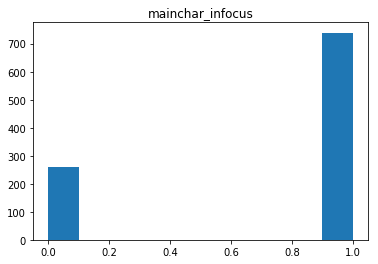

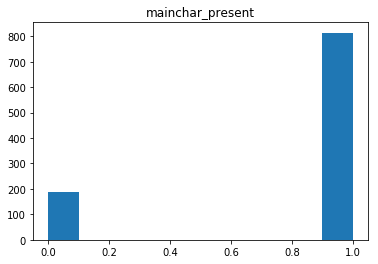

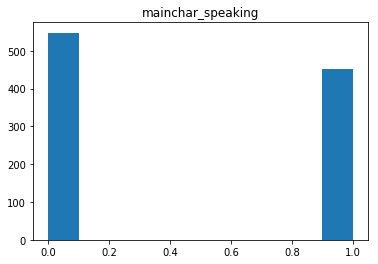

In [5]:
for feat in range(14):
    plt.figure()
    plt.hist(features[features.columns[feat + 2]])
    plt.title(features.columns[feat + 2])
    
# There are a lot of unbalanced ones, but the most promising features are:
# speech, music, outdoors, mainchar_infocus, mainchar_present, mainchar_speaking

In [6]:
# create, for each participant, accuracies of predictions of features as well?
feat_accs = [] # n x feats, keeps accuracy (or correlation, for continuous across time)
feat_accs_sc = [] # n x feats x time, whether or not correctly recalled (round predictions for continuous)
for pid in range(n):
    feataccs = []
    feataccs_sc = []
    for feat in range(14):
        featvec = expandFeature(features.columns[feat + 2])
        if feat < 4: # correlation 
            acc = np.abs(np.corrcoef(featvec, featmats[pid, feat, :])[0, 1])
        else:
            acc = np.mean(np.round(featvec) == np.round(featmats[pid, feat, :]))
            
        feataccs.append(acc)
        feataccs_sc.append(np.round(featmats[pid, feat, :]) == featvec)
    feat_accs.append(feataccs)
    feat_accs_sc.append(np.reshape(feataccs_sc, [14, -1]))
        
feat_accs = np.array(feat_accs)
feat_accs_sc = np.array(feat_accs_sc)

In [13]:
feat_accs[0]

array([0.0459449 , 0.13228797, 0.05864795, 0.01973169, 0.951417  ,
       0.58097166, 0.56781377, 0.66447368, 0.91548583, 0.92611336,
       0.95546559, 0.66548583, 0.72419028, 0.50506073])

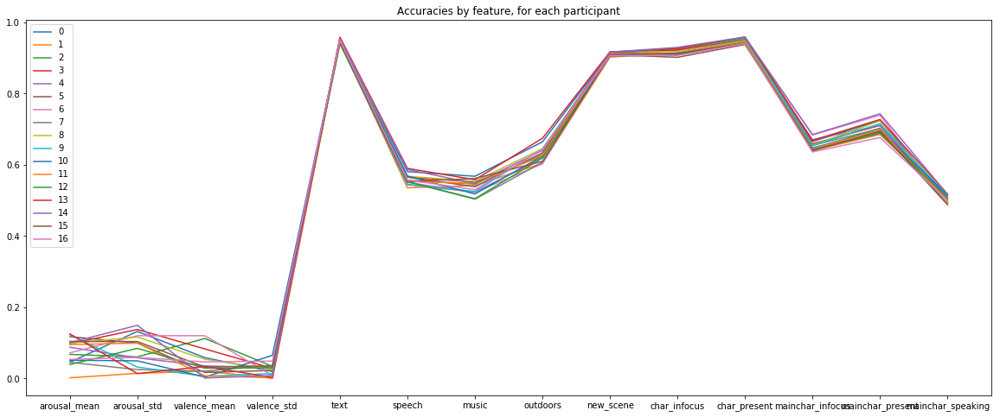

In [10]:
feat_accs[0], feat_accs[1], feat_accs[2]
fig = plt.figure(figsize=[20, 8])
for pid in range(n):
    plt.plot(range(14), feat_accs[pid])
plt.title("Accuracies by feature, for each participant")
plt.xticks(range(14), features.columns[2:])
plt.legend(range(n))

In [29]:
feat_accs_sc[0, 0]

array([False, False, False, ..., False, False,  True])

/gpfs/milgram/apps/hpc.rhel7/software/Python/Anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


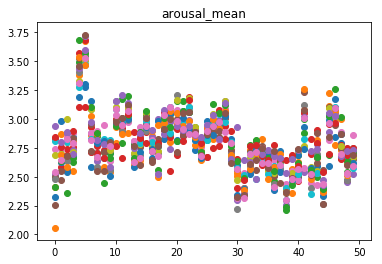

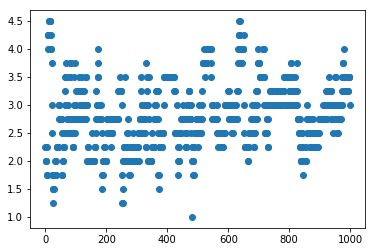

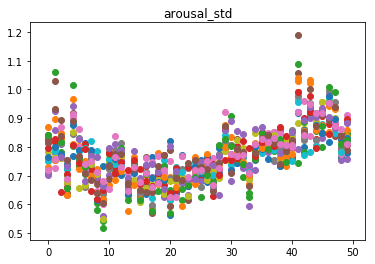

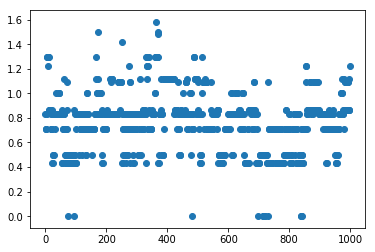

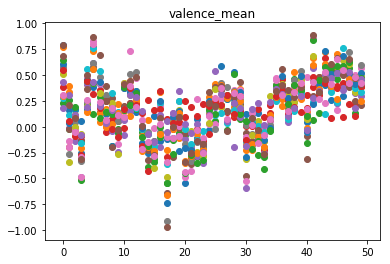

...

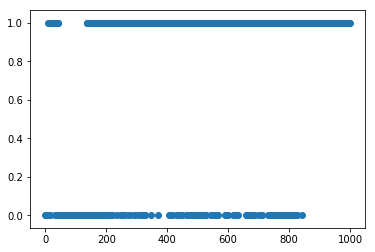

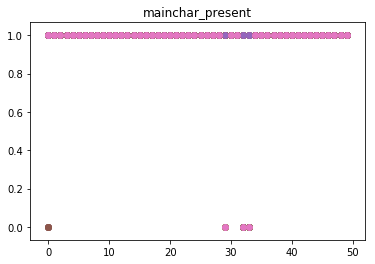

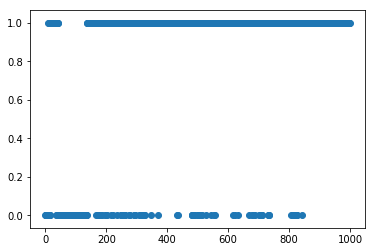

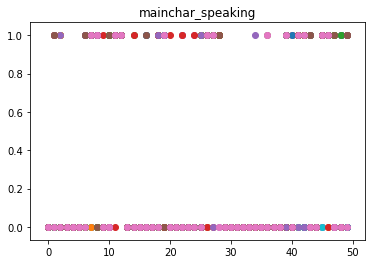

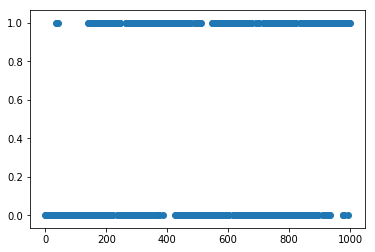

In [28]:
np.shape(featmats_sc)
for feat in range(14):
    plt.figure()
    for pid in range(n):
        plt.scatter(range(nScenes), featmats_sc[pid, feat, :])
    plt.title(features.columns[feat + 2])
    plt.figure()
    plt.scatter(range(1000), features[features.columns[feat + 2]])
    #plt.scatter(range(nScenes), features[features.columns[feat]])

In [151]:
def predictRecallLOO_all(recalltype, pid, classifier = svm.SVC(), showplt = False):
    train_pids = [i for i in range(n) if i != pid]
    test_pids = [pid]
    
    ytrain = np.ravel(recall_dfs[train_pids, :, recalltype])
    ytest = np.ravel(recall_dfs[test_pids, :, recalltype])
    xtrain = flatdat(featmats_sc[train_pids, :, :])
    xtest = flatdat(featmats_sc[test_pids, :, :])
    
    classifier.fit(xtrain, ytrain)
    preds = classifier.predict(xtest)
    
    if showplt:
        plt.figure()
        plt.scatter(range(nScenes), ytest, alpha = 0.75)
        plt.scatter(range(nScenes), preds, alpha = 0.25)
        plt.legend(["Y", "Y'"])
        arr = list(ytest)
        baseline = np.mean(ytest == max(arr, key = arr.count))
        plt.title("Recall prediction accuracy for pid " + str(pid) + ": " + str(np.mean(preds == ytest)) + "/" + str(baseline))
    
    return np.mean(preds == ytest)

def predictRecallLOOCV_all(recalltype, classifier = svm.SVC()):
    cvscores = []
    for pid in range(n): # leave one participant out for the cv 
        results = predictRecallLOO_all(recalltype, pid, classifier, True)
        cvscores.append(results)
    return np.array(cvscores) # list of accuracy for each subject

array([0.54, 0.5 , 0.62, 0.64, 0.64, 0.78, 0.58, 0.74, 0.54, 0.74, 0.68,
       0.76, 0.96, 0.74, 0.56, 0.72, 0.74])

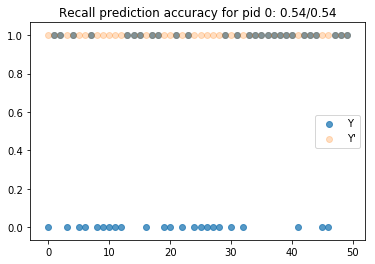

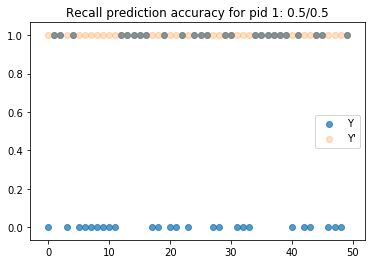

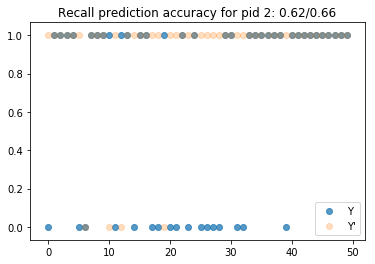

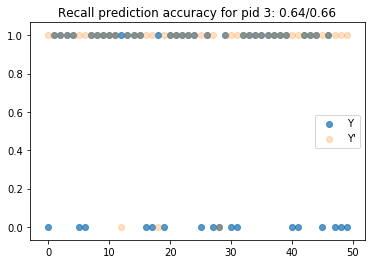

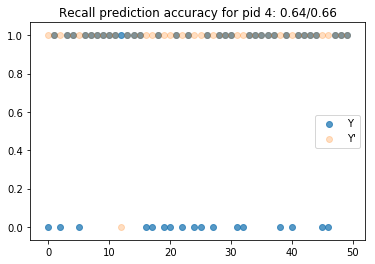

...

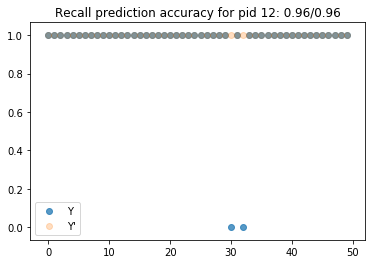

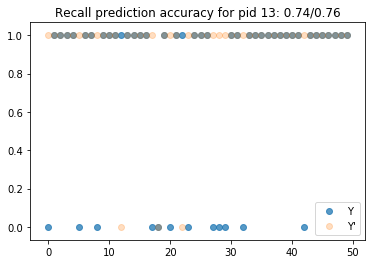

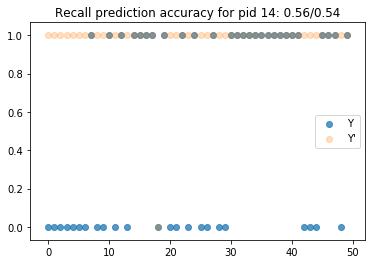

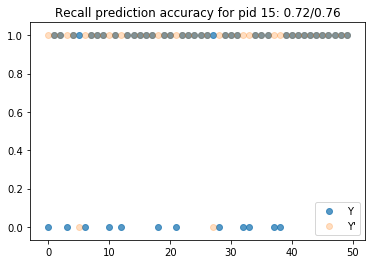

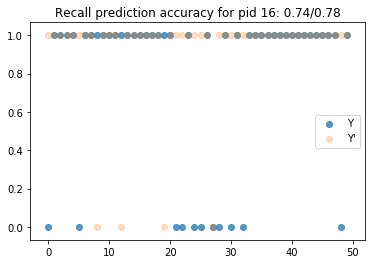

In [156]:
scores = predictRecallLOOCV_all(0, KNeighborsClassifier(50))
scores

In [167]:
def predictRecallLOO(recalltype, pid, var, classifier = svm.SVC(), showplt = False):
    train_pids = [i for i in range(n) if i != pid]
    test_pids = [pid]
    
    ytrain = np.ravel(recall_dfs[train_pids, :, recalltype])
    ytest = np.ravel(recall_dfs[test_pids, :, recalltype])
    xtrain = featmats_sc[train_pids, var, :]
    xtest = featmats_sc[test_pids, var, :]
    
    classifier.fit(np.reshape(xtrain, [-1, 1]), ytrain)
    preds = classifier.predict(np.reshape(xtest, [-1, 1]))
    
    if showplt:
        plt.figure()
        plt.scatter(range(nScenes), ytest, alpha = 0.75)
        plt.scatter(range(nScenes), preds, alpha = 0.25)
        plt.legend(["Y", "Y'"])
        arr = list(ytest)
        baseline = np.mean(ytest == max(arr, key = arr.count))
        plt.title(features.columns[var + 2] + " recall prediction accuracy for pid " + str(pid) + ": " + str(np.mean(preds == ytest)) + "/" + str(baseline))
    
    return np.mean(preds == ytest)

def nullRecallLOO(recalltype, pid, var, classifier = svm.SVC(), showplt = False):
    train_pids = [i for i in range(n) if i != pid]
    test_pids = [pid]
    
    ytrain = np.ravel(recall_dfs[train_pids, :, recalltype])
    ytest = np.ravel(recall_dfs[test_pids, :, recalltype])
    xtrain = featmats_sc[train_pids, var, :]
    xtest = featmats_sc[test_pids, var, :]
    
    ytrain = np.random.choice(ytrain, len(ytrain), replace = False)
    
    classifier.fit(np.reshape(xtrain, [-1, 1]), ytrain)
    preds = classifier.predict(np.reshape(xtest, [-1, 1]))
    
    return np.mean(preds == ytest)

def predictRecallLOOCV(recalltype, var, classifier = svm.SVC()):
    cvscores = []
    nullscores = []
    for pid in range(n): # leave one participant out for the cv 
        results = predictRecallLOO(recalltype, pid, var, classifier)
        cvscores.append(results)
        nullscores.append(nullRecallLOO(recalltype, pid, var, classifier))
    return np.array(cvscores), np.array(nullscores) # list of accuracy for each subject

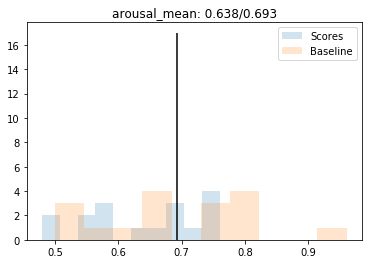

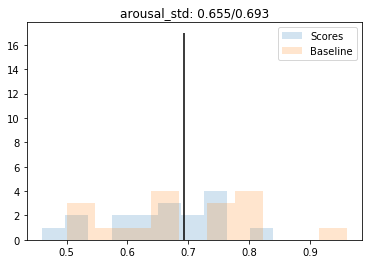

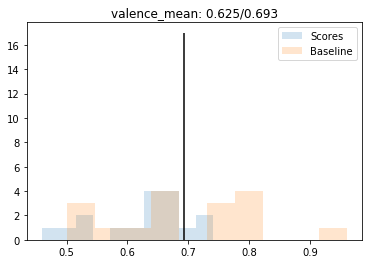

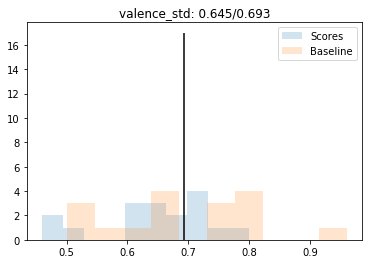

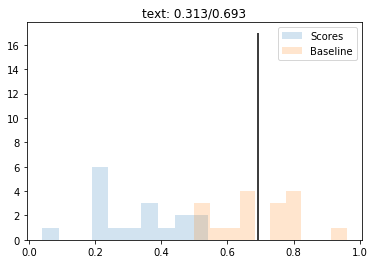

...

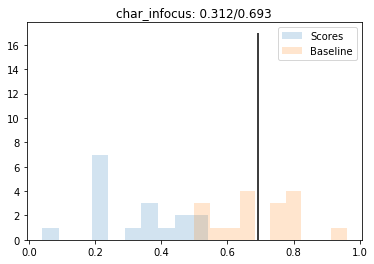

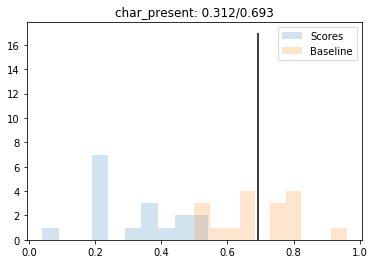

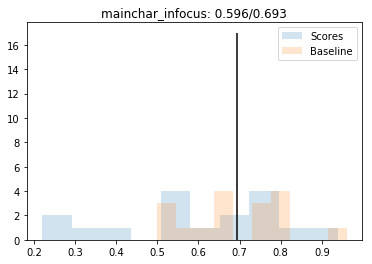

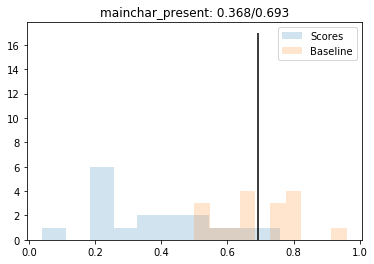

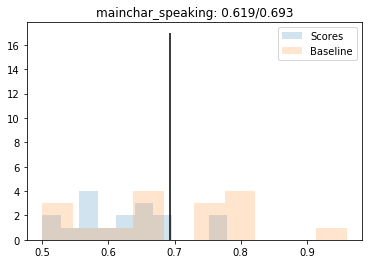

In [199]:
# are we able to use participants' feature predictions to predict their recalls?
recallres = []
nullres = []
for feature in range(14):
    cvScores, nullScores = predictRecallLOOCV(0, feature, KNeighborsClassifier())
    recallres.append(np.mean(cvScores))
    nullres.append(np.mean(nullScores))
    plt.figure()
    plt.hist(cvScores, alpha = 0.2)
    baselines = []
    for pid in range(n):
        arr = list(recall_dfs[pid, :, 0])
        baselines.append(np.mean(arr == max(arr, key = arr.count)))
    plt.hist(baselines, alpha = 0.2)
    plt.legend(["Scores", "Baseline"])
    plt.vlines(np.mean(baselines), ymin = 0, ymax = n)
    plt.title(features.columns[feature + 2] + ": " + str(np.round(np.mean(cvScores), 3)) + "/" + str(np.round(np.mean(baselines), 3)))

In [200]:
stats.ttest_rel(recallres, nullres)

Ttest_relResult(statistic=-3.384229082916021, pvalue=0.004888241412812612)

In [197]:
# what about their *feature accuracies*?

def predictRecallLOO2(recalltype, pid, var, classifier = svm.SVC()):
    train_pids = [i for i in range(n) if i != pid]
    test_pids = [pid]
    
    ytrain = np.ravel(recall_dfs[train_pids, :, recalltype])
    ytest = np.ravel(recall_dfs[test_pids, :, recalltype])
    
    X = np.array([scene_voxelavg(feat_accs_sc[i], 0) for i in range(n)])
    xtrain = X[train_pids, var, :]
    xtest = X[test_pids, var, :]
    
    classifier.fit(np.reshape(xtrain, [-1, 1]), ytrain)
    preds = classifier.predict(np.reshape(xtest, [-1, 1]))
    return np.mean(preds == ytest)


def nullRecallLOO2(recalltype, pid, var, classifier = svm.SVC()):
    train_pids = [i for i in range(n) if i != pid]
    test_pids = [pid]
    
    ytrain = np.ravel(recall_dfs[train_pids, :, recalltype])
    ytest = np.ravel(recall_dfs[test_pids, :, recalltype])
    
    X = np.array([scene_voxelavg(feat_accs_sc[i], 0) for i in range(n)])
    xtrain = X[train_pids, var, :]
    xtest = X[test_pids, var, :]
    
    ytrain = np.random.choice(ytrain, len(ytrain), replace = False)
    
    classifier.fit(np.reshape(xtrain, [-1, 1]), ytrain)
    preds = classifier.predict(np.reshape(xtest, [-1, 1]))
    return np.mean(preds == ytest)

def predictRecallLOOCV2(recalltype, var, classifier = svm.SVC()):
    cvscores = []
    nullscores = []
    for pid in range(n): # leave one participant out for the cv 
        results = predictRecallLOO2(recalltype, pid, var, classifier)
        cvscores.append(results)
        nullscores.append(nullRecallLOO2(recalltype, pid, var, classifier))
    return np.array(cvscores), np.array(nullscores) # list of accuracy for each subject

recallres = []
nullres = []
for feature in range(14):
    cvScores, nullscores = predictRecallLOOCV2(0, feature, KNeighborsClassifier(5))
    recallres.append(np.mean(cvScores))
    nullres.append(np.mean(nullscores))
    """
    plt.figure()
    plt.hist(cvScores, alpha = 0.2)
    baselines = []
    for pid in range(n):
        arr = list(recall_dfs[pid, :, 0])
        baselines.append(np.mean(arr == max(arr, key = arr.count)))
    plt.hist(baselines, alpha = 0.2)
    plt.legend(["Scores", "Baseline"])
    plt.vlines(np.mean(baselines), ymin = 0, ymax = n)
    plt.title(features.columns[feature + 2] + ": " + str(np.round(np.mean(cvScores), 3)) + "/" + str(np.round(np.mean(baselines), 3)))
    """
stats.ttest_rel(recallres, nullres)

Ttest_relResult(statistic=5.18918556842893, pvalue=0.0001743417310913808)

In [198]:
[(i, j) for (i, j) in zip(recallres, nullres)]

[(0.6247058823529411, 0.6329411764705883),
 (0.7047058823529412, 0.6247058823529412),
 (0.6647058823529413, 0.6105882352941177),
 (0.6188235294117648, 0.6235294117647059),
 (0.6764705882352942, 0.6058823529411764),
 (0.6588235294117647, 0.6047058823529411),
 (0.6529411764705881, 0.6317647058823529),
 (0.6458823529411766, 0.6152941176470589),
 (0.7035294117647058, 0.6447058823529411),
 (0.6670588235294117, 0.6305882352941177),
 (0.6894117647058824, 0.6164705882352941),
 (0.6576470588235295, 0.6141176470588235),
 (0.6811764705882353, 0.6341176470588236),
 (0.6305882352941177, 0.6294117647058823)]

Text(0.5, 1.0, 'Accuracy of recall by feature accuracy')

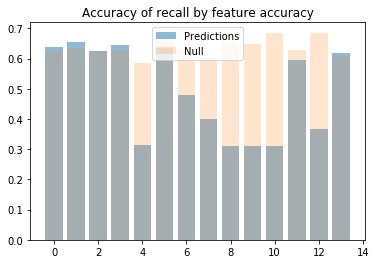

In [208]:
plt.bar(range(14), recallres, alpha = 0.5)
plt.bar(range(14), nullres, alpha = 0.2)
plt.legend(["Predictions", "Null"])
plt.title("Accuracy of recall by feature accuracy")

In [44]:
np.shape(feat_accs_sc)

(17, 14, 1976)

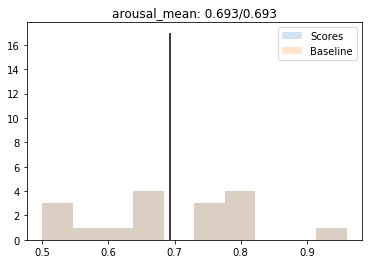

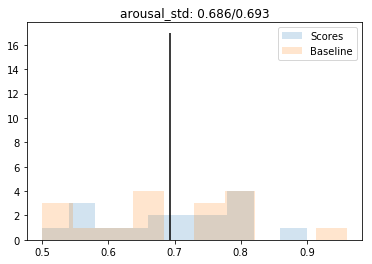

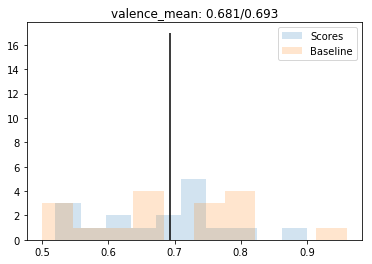

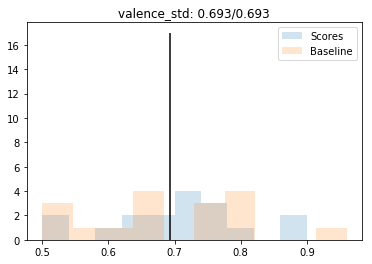

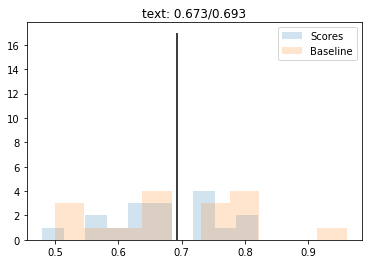

...

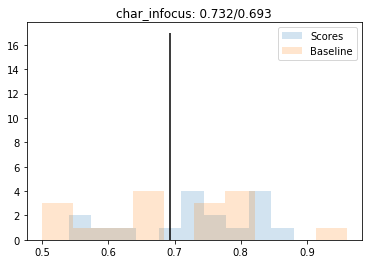

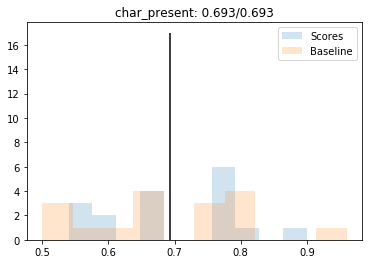

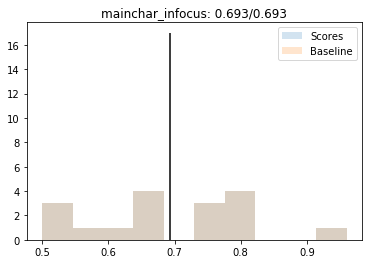

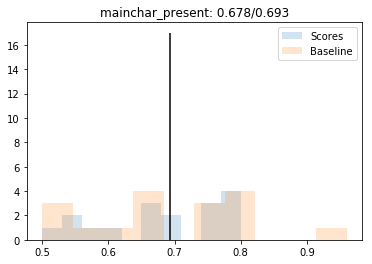

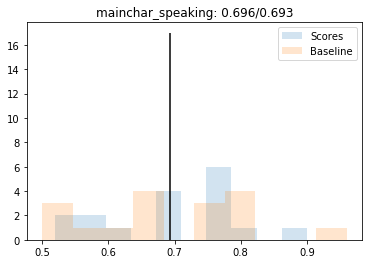

In [47]:
recallres = []
for feature in range(14):
    cvScores = predictRecallLOOCV2(0, feature, GaussianNB())
    recallres.append(cvScores)
    plt.figure()
    plt.hist(cvScores, alpha = 0.2)
    baselines = []
    for pid in range(n):
        arr = list(recall_dfs[pid, :, 0])
        baselines.append(np.mean(arr == max(arr, key = arr.count)))
    plt.hist(baselines, alpha = 0.2)
    plt.legend(["Scores", "Baseline"])
    plt.vlines(np.mean(baselines), ymin = 0, ymax = n)
    plt.title(features.columns[feature + 2] + ": " + str(np.round(np.mean(cvScores), 3)) + "/" + str(np.round(np.mean(baselines), 3)))

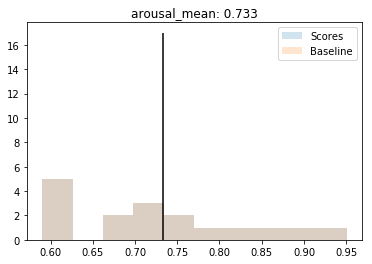

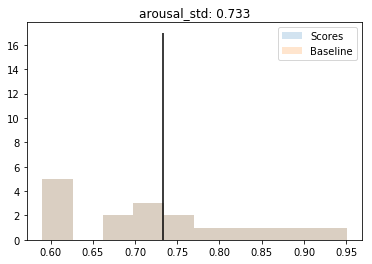

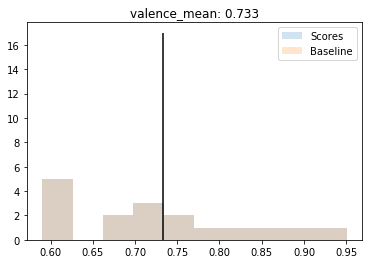

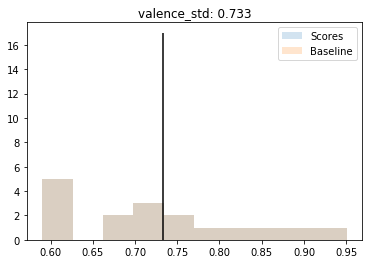

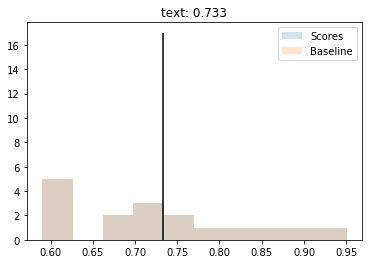

...

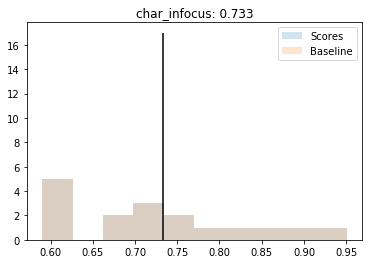

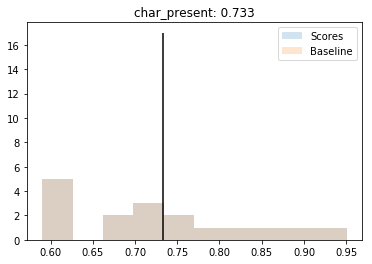

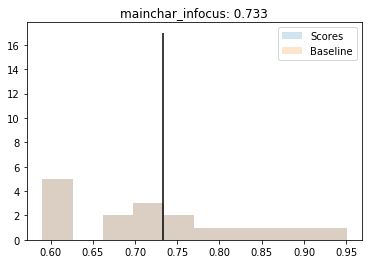

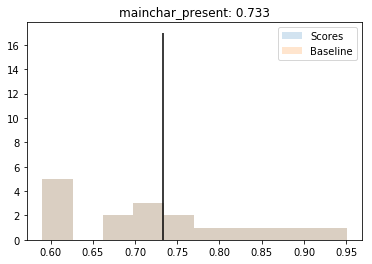

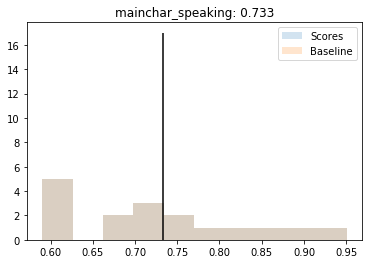

In [193]:
# trying again, by TRs
# given a participant index and
# recalltype (0 for nRecall, 1 for time of recall, 2 for quality of recall)
# returns a nTRs-len vector representation for recall from start scene index
def get_recall_labels(pidx, startind, recalltype, endind = nScenes):
    labels_byTR = []
    startTR = movieTRs[startind, 1] - 1 
    for sceneidx in range(startind, endind):
        endTR = movieTRs[sceneidx, 2] - 1 
        labels_byTR = np.append(labels_byTR, 
            np.repeat(recall_dfs[pidx, sceneidx, recalltype], endTR-startTR+1))
        startTR = endTR + 1
    return labels_byTR

def predictRecallLOO3(recalltype, pid, var, classifier = svm.SVC(), showplt = False):
    train_pids = [i for i in range(n) if i != pid]
    test_pids = [pid]
    
    Y = np.array([get_recall_labels(i, 0, recalltype) for i in range(n)])
    ytrain = flatlabs(Y[train_pids])
    ytest = flatlabs(Y[test_pids])
    X = feat_accs_sc
    xtrain = X[train_pids, var, :]
    xtest = X[test_pids, var, :]
    
    classifier.fit(np.reshape(flatdat(xtrain), [-1, 1]), ytrain)
    preds = classifier.predict(np.reshape(flatdat(xtest), [-1, 1]))
    return np.mean(preds == ytest)

def predictRecallLOOCV3(recalltype, var, classifier = svm.SVC()):
    cvscores = []
    for pid in range(n): # leave one participant out for the cv 
        results = predictRecallLOO3(recalltype, pid, var, classifier)
        cvscores.append(results)
    return np.array(cvscores) # list of accuracy for each subject

for feature in range(14):
    cvScores = predictRecallLOOCV3(0, feature, linear_model.LogisticRegression())
    recallres.append(cvScores)
    plt.figure()
    plt.hist(cvScores, alpha = 0.2)
    baselines = []
    for pid in range(n):
        arr = list(get_recall_labels(pid, 0, 0))
        baselines.append(np.mean(arr == max(arr, key = arr.count)))
    plt.hist(baselines, alpha = 0.2)
    plt.legend(["Scores", "Baseline"])
    plt.vlines(np.mean(baselines), ymin = 0, ymax = n)
    plt.title(features.columns[feature + 2] + ": " + str(np.round(np.mean(cvScores), 3)))

([<matplotlib.axis.XTick at 0x2b230111d080>,
 <a list of 14 Text xticklabel objects>)

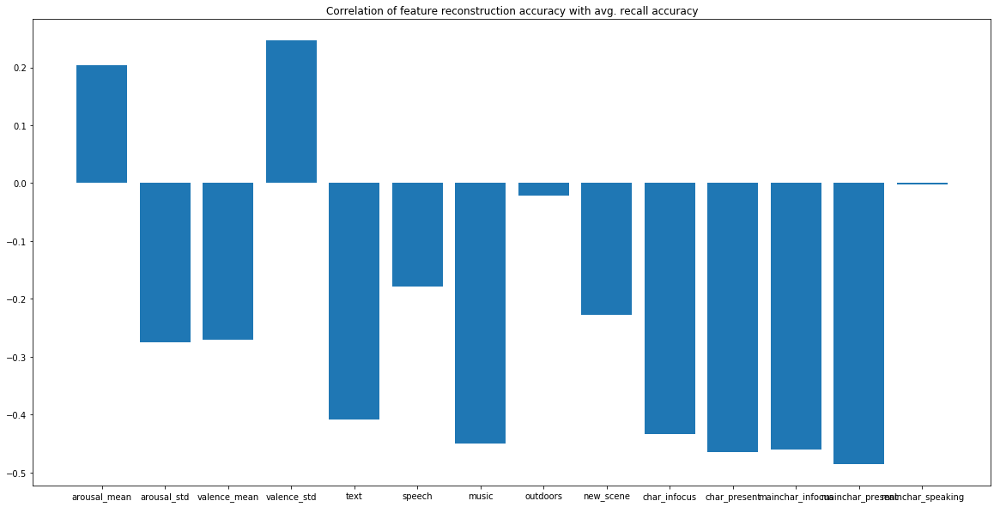

In [49]:
# recall feat_accs, n x feats, keeps correlation (for continuous variables) and accuracy (for binary) across time
# for each feature, can we try to see if its accuracy of prediction is related to recall?
corrs = []
for feat in range(14):
    #lm = linear_model.LinearRegression()
    #lm.fit(np.reshape(feat_accs[:, feat], [-1, 1]), np.reshape(np.mean(recall_dfs[:, :, 0], axis = 1), [-1, 1]))
    #corrs.append(lm.coef_[0][0])
    corrs.append(np.corrcoef(feat_accs[:, feat], np.mean(recall_dfs[:, :, 0], axis = 1))[0, 1])
    
plt.figure(figsize=(20,10)) 
plt.bar(range(14), corrs)
plt.title("Correlation of feature reconstruction accuracy with avg. recall accuracy")
plt.xticks(range(14), list(features.columns[2:]))

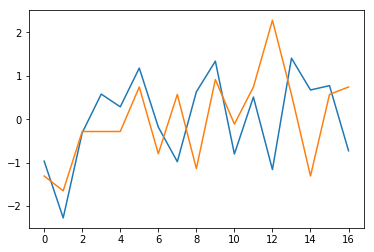

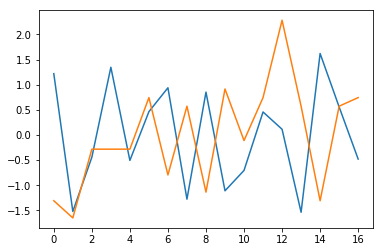

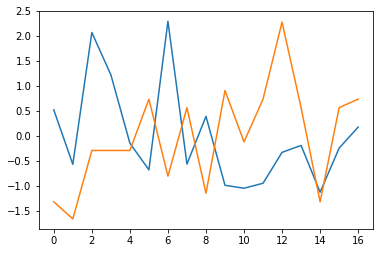

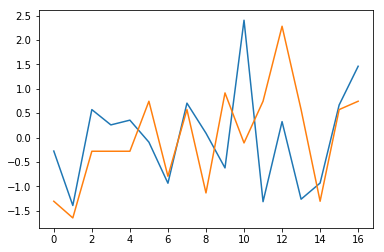

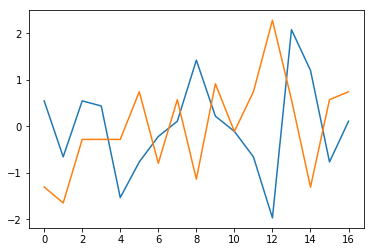

...

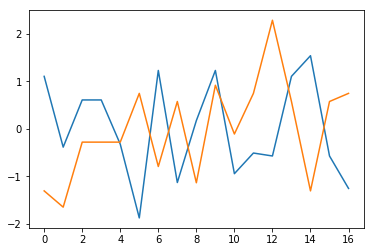

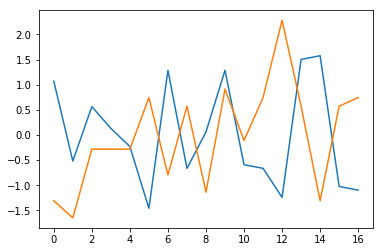

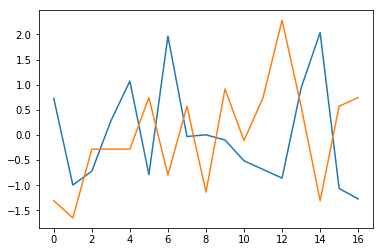

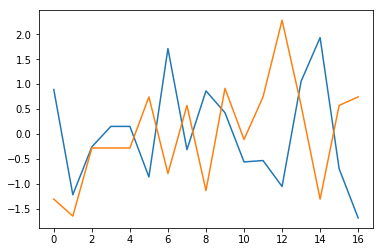

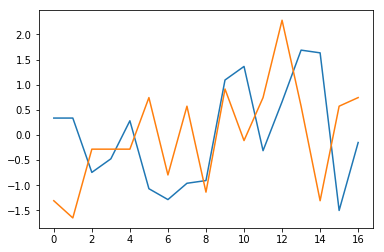

In [59]:
for feat in range(14):
    np.corrcoef(feat_accs[:, feat], np.mean(recall_dfs[:, :, 0], axis = 1))[0, 1]
    plt.figure()
    plt.plot(stats.zscore(feat_accs[:, feat]))
    plt.plot(stats.zscore(np.mean(recall_dfs[:, :, 0], axis = 1)))
    
    # the correlations seem mostly erroneous because there is in fact
    # not much difference between the participants in terms of feature accs.

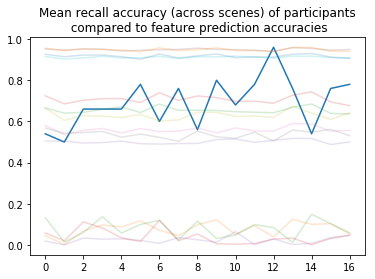

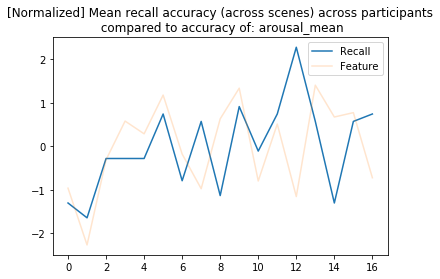

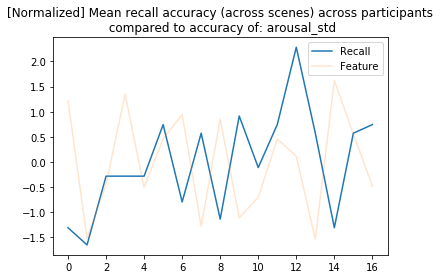

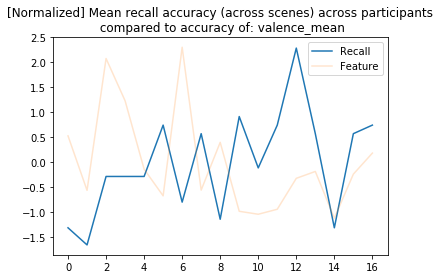

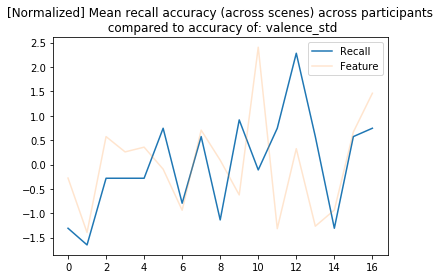

...

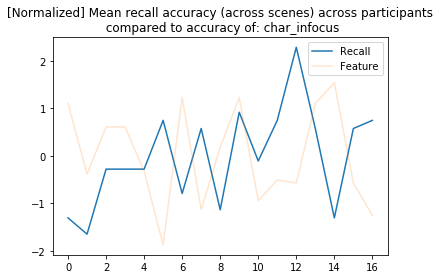

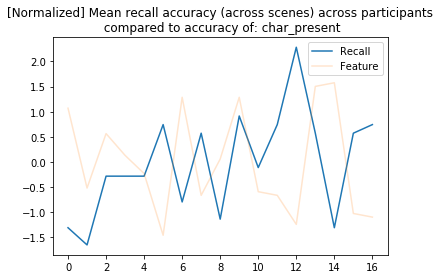

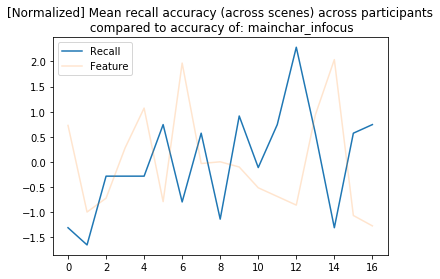

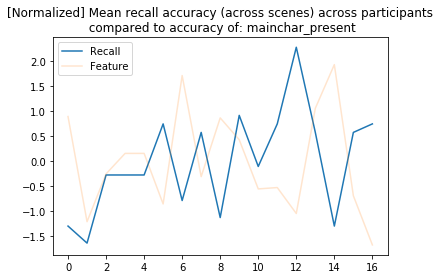

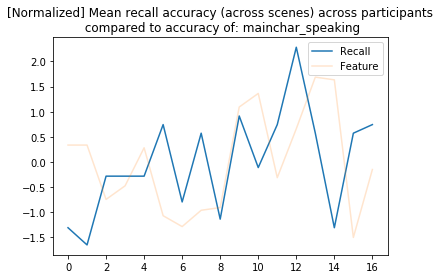

In [65]:
# The ability of participants to recall any particular feature is pretty constant 
plt.plot(range(n), [np.mean(recall_dfs[i, :, 0]) for i in range(n)])
for feat in range(14):
    plt.plot(range(n), feat_accs[:, feat], alpha = 0.2)
plt.title("Mean recall accuracy (across scenes) of participants\n compared to feature prediction accuracies")
for feat in range(14):
    plt.figure()
    plt.plot(range(n), stats.zscore([np.mean(recall_dfs[i, :, 0]) for i in range(n)]))
    plt.plot(range(n), stats.zscore(feat_accs[:, feat]), alpha = 0.2)
    plt.legend(["Recall", "Feature"])
    plt.title("[Normalized] Mean recall accuracy (across scenes) across participants\n compared to accuracy of: " + features.columns[2 + feat])

In [68]:
np.shape(featmats), np.shape(featmats_sc), np.shape(recall_dfs)

((17, 14, 1976), (17, 14, 50), (17, 50, 3))

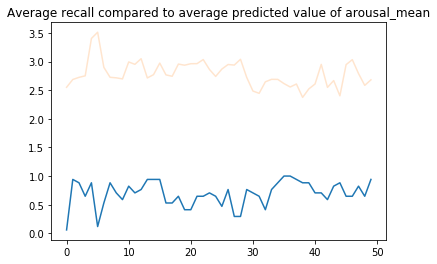

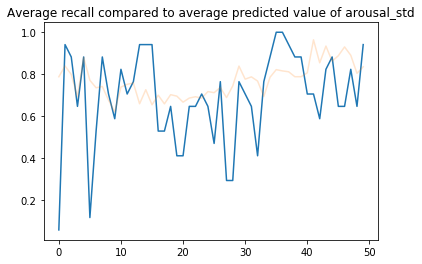

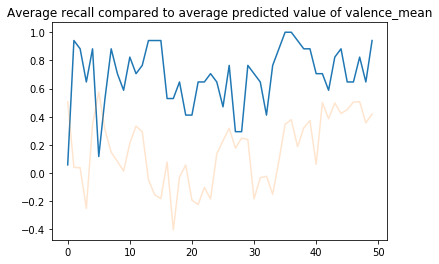

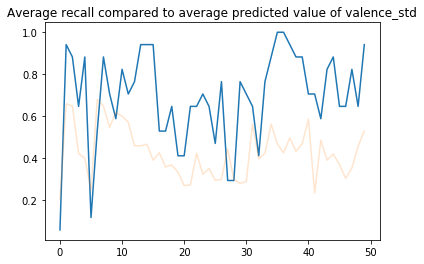

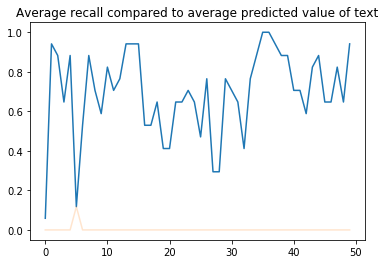

...

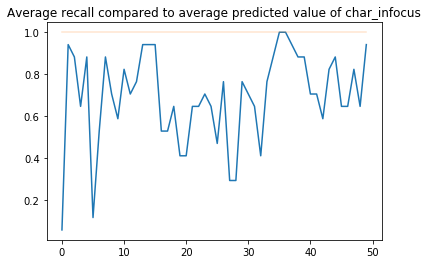

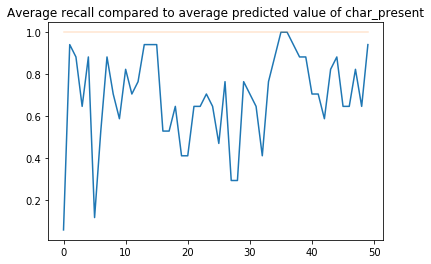

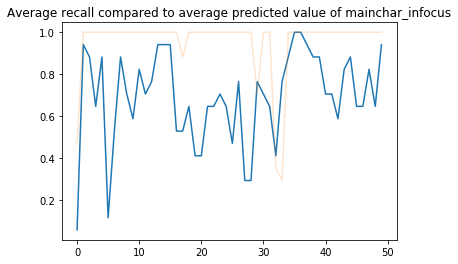

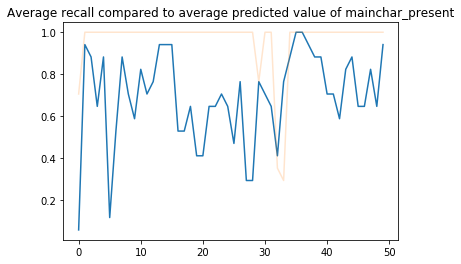

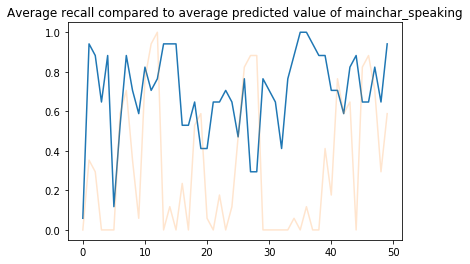

In [72]:
# The ability of participants to recall any particular feature is pretty constant 
for feat in range(14):
    plt.figure()
    plt.plot(range(nScenes), [np.mean(recall_dfs[:, i, 0]) for i in range(nScenes)])
    plt.plot(range(nScenes), np.mean(featmats_sc[:, feat, :], axis = 0), alpha = 0.2)
    plt.title("Average recall compared to average predicted value of " + features.columns[feat + 2])

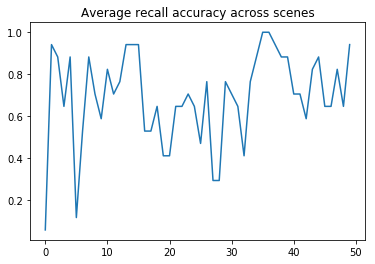

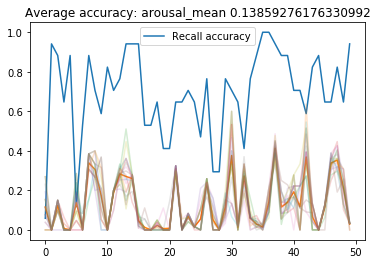

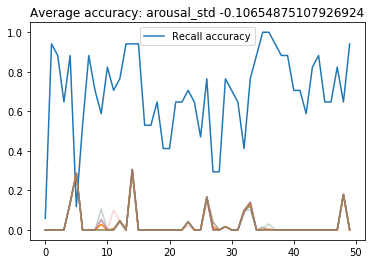

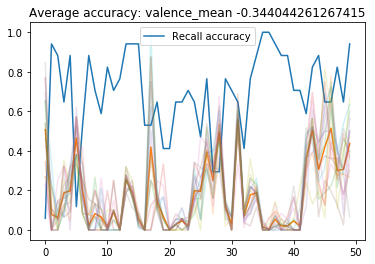

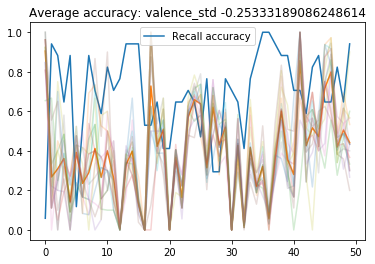

...

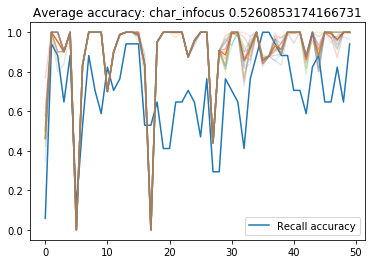

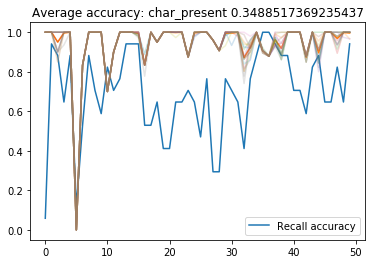

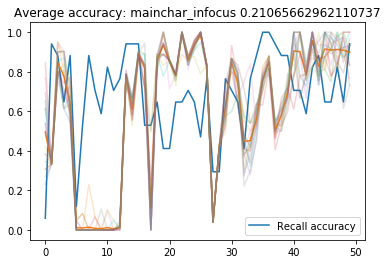

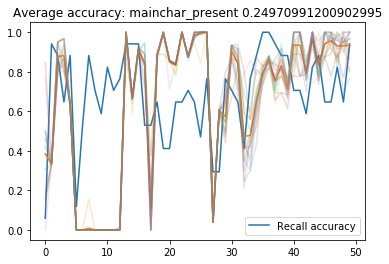

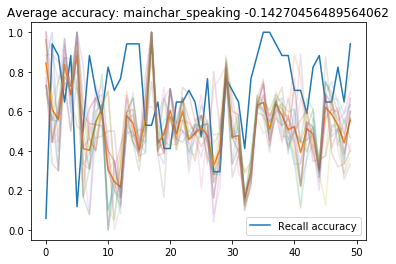

In [74]:
# Plot average feature accuracy across scenes 
feataccs_byScene = np.array([scene_voxelavg(feat_accs_sc[i], 0) for i in range(n)])
recallbyScene = [np.mean(recall_dfs[:, i, 0]) for i in range(nScenes)]
plt.plot(range(nScenes), recallbyScene)
plt.title("Average recall accuracy across scenes")
for feat in range(14):
    plt.figure()
    accsbyScene = np.mean(feataccs_byScene[:, feat, :], axis = 0)
    plt.plot(range(nScenes), recallbyScene)
    plt.plot(range(nScenes), accsbyScene)
    for pid in range(n):
        plt.plot(range(nScenes), feataccs_byScene[pid, feat, :], alpha = 0.2)
    plt.legend(["Recall accuracy"])
    plt.title("Average accuracy: " + features.columns[feat + 2]+ " " + str(np.corrcoef(recallbyScene, accsbyScene)[0, 1]))

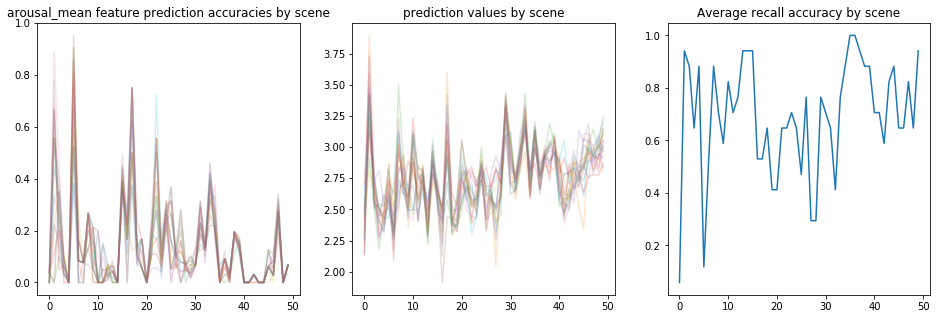

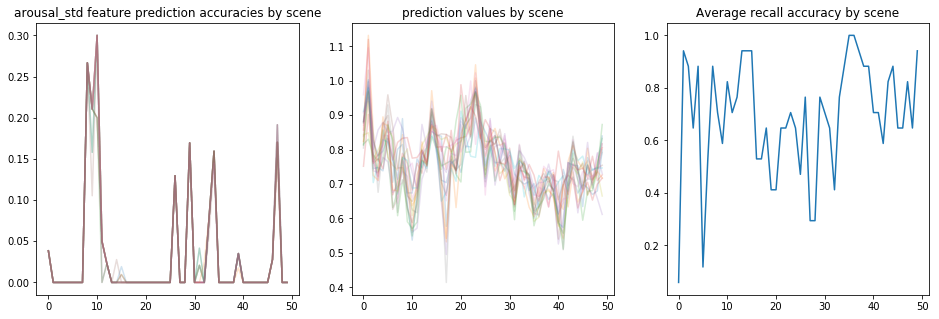

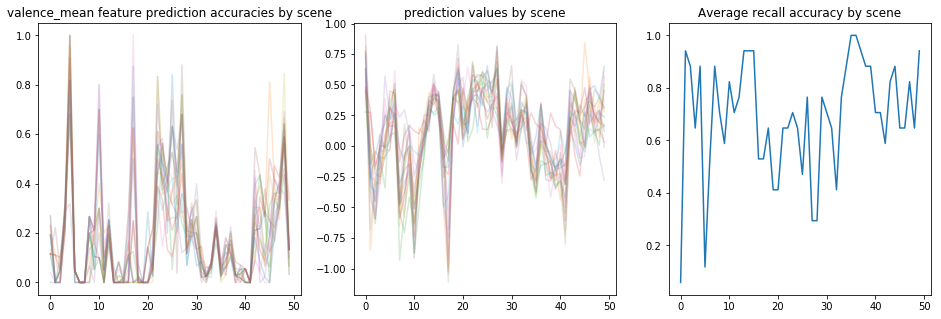

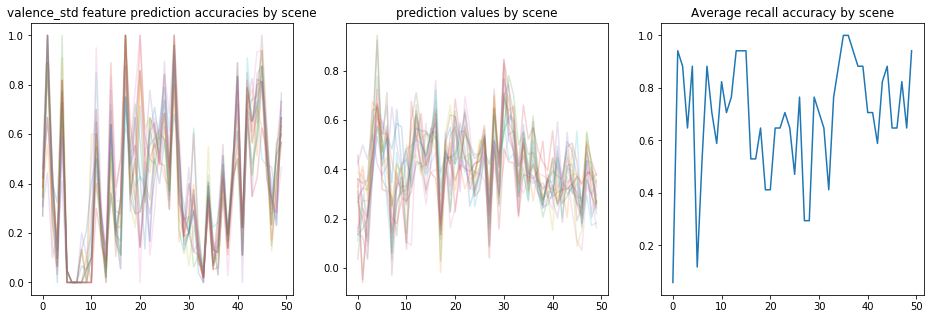

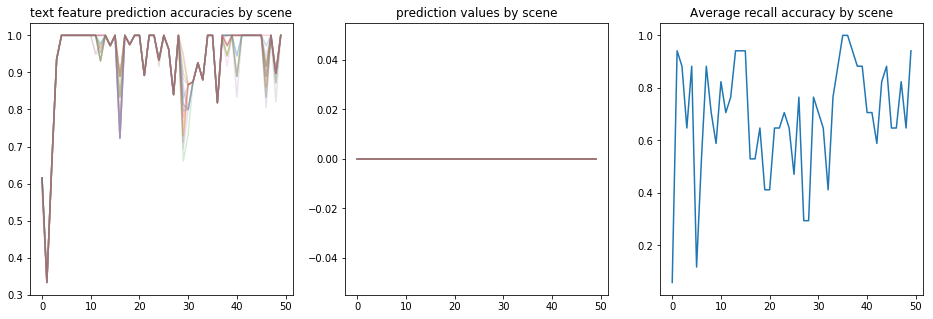

...

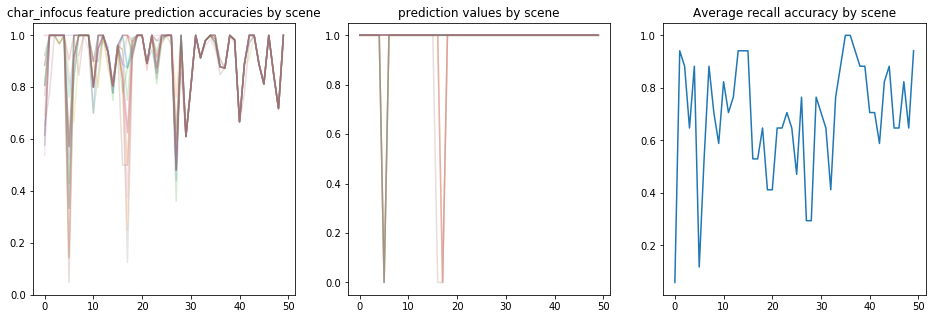

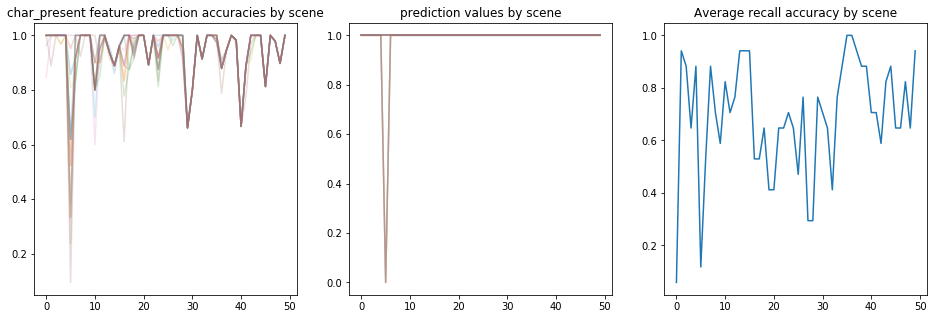

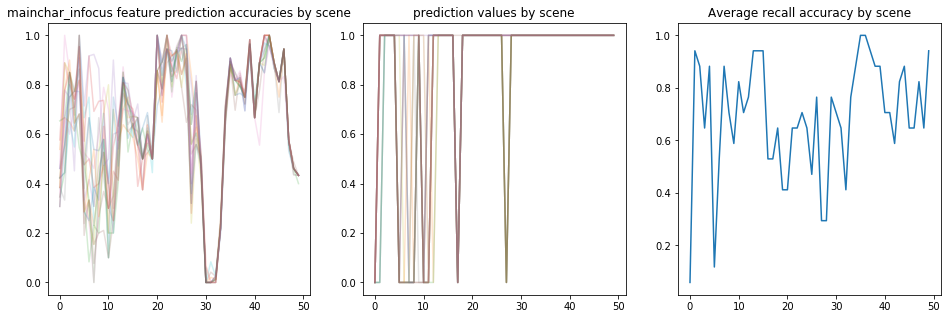

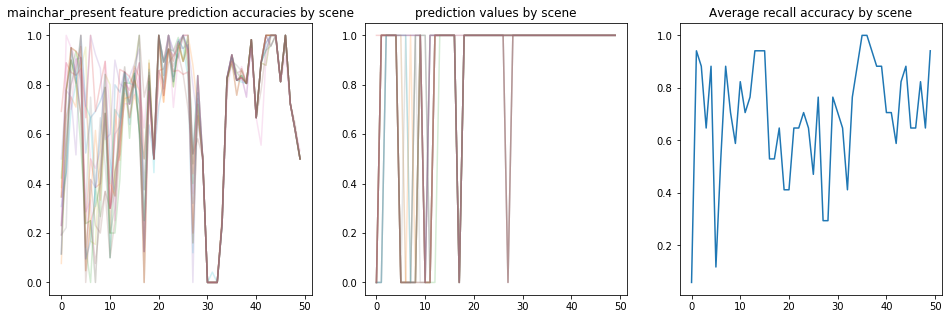

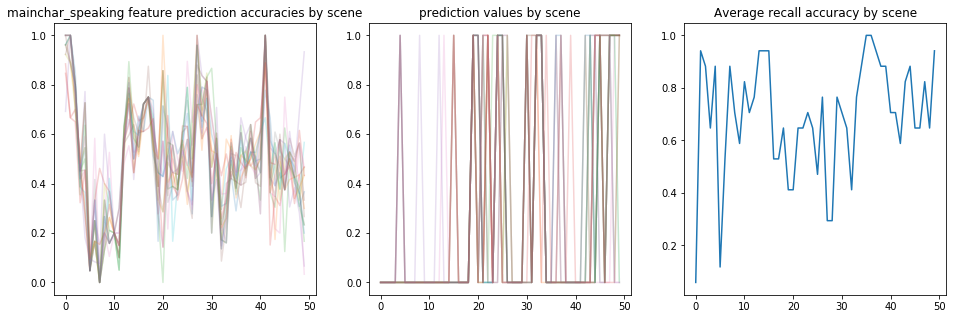

In [125]:
# For each feature, let's plot the accuracy AND values across scenes
for feat in range(14):
    fig = plt.figure(figsize=[16, 5])
    ax = fig.add_subplot(1, 3, 1)
    ax.set_title(features.columns[feat + 2] + " feature prediction accuracies by scene")
    for pid in range(n):
        ax.plot(range(nScenes), feataccs_byScene[pid, feat, :], alpha = 0.2)
    ax = fig.add_subplot(1, 3, 2)
    ax.set_title("prediction values by scene")
    for pid in range(n):
        ax.plot(range(nScenes), featmats_sc[pid, feat, :], alpha = 0.2)
    ax = fig.add_subplot(1, 3, 3)
    ax.set_title("Average recall accuracy by scene")
    ax.plot(range(nScenes), recallbyScene)


In [139]:
print("Coefficients for recall by feature accuracies: coef, mean sample coef, mean std")
acc_coefs = []
for feat in range(14):
    mod = linear_model.LogisticRegression()
    X = np.array([scene_voxelavg(feat_accs_sc[i], 0) for i in range(n)])[:, feat, :]
    mod.fit(np.reshape(X, [-1, 1]), np.ravel(recall_dfs[:, :, 0]))
    coef = np.round(mod.coef_[0][0], 3)
    coefs = []
    for it in range(100):
        it_pids = np.random.choice(n, round(n/2))
        mod = linear_model.LogisticRegression()
        mod.fit(np.reshape(X[it_pids], [-1, 1]), np.ravel(recall_dfs[it_pids, :, 0]))
        coefs.append(np.round(mod.coef_[0][0], 3))
    pval = np.round(stats.ttest_1samp(coefs, 0).pvalue, 3)
    signif = "*" * (1 * (pval < .05)) + "*" * (1 * (pval < .01))
    print(features.columns[feat + 2], coef, np.round(np.mean(coefs), 3), np.round(np.std(coefs)/np.sqrt(100), 3), signif)
    acc_coefs.append([np.round(np.mean(coefs), 3), np.round(np.std(coefs)/np.sqrt(100), 3)])

Coefficients for recall by feature accuracies: coef, mean sample coef, mean std
arousal_mean 0.729 0.606 0.038 **
arousal_std -0.736 -0.487 0.028 **
valence_mean -0.952 -0.918 0.046 **
valence_std -0.764 -0.648 0.028 **
text 1.464 1.08 0.027 **
speech -1.054 -0.928 0.034 **
music -0.483 -0.402 0.031 **
outdoors -0.644 -0.525 0.03 **
new_scene 1.254 1.045 0.025 **
char_infocus 1.983 1.8 0.032 **
char_present 1.669 1.373 0.018 **
mainchar_infocus 0.628 0.57 0.027 **
mainchar_present 0.658 0.657 0.022 **
mainchar_speaking -0.363 -0.262 0.049 **


Text(0.5, 1.0, 'Logistic regression coefficients of features accuracies on recall')

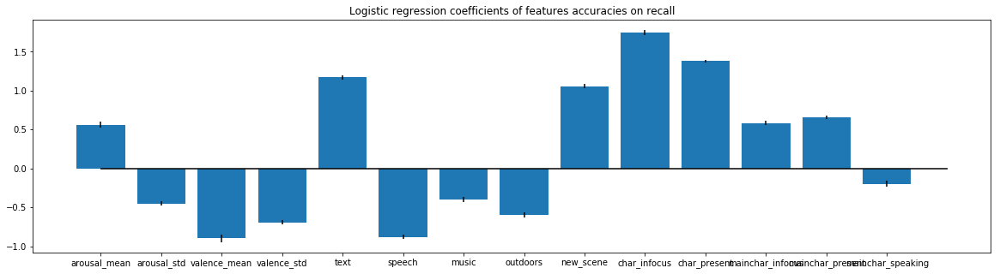

In [135]:
bars = np.array(acc_coefs)[:, 0]
sd = np.array(acc_coefs)[:, 1]
plt.figure(figsize = [20, 5])
plt.bar(range(14), bars)
plt.errorbar(range(14), bars, yerr = sd, linestyle = '', c = 'Black')
plt.hlines(0, 0, 14)
plt.xticks(range(14), features.columns[2:])
plt.title("Logistic regression coefficients of features accuracies on recall")

In [140]:
print("Coefficients for recall by feature predictions: coef, mean sample coef, mean std")
pred_coefs = []
for feat in range(14):
    X = featmats_sc[:, feat, :]
    mod = linear_model.LogisticRegression()
    mod.fit(np.reshape(X, [-1, 1]), np.reshape(recall_dfs[:, :, 0], [-1, 1]))
    coef = np.round(mod.coef_[0][0], 3)
    coefs = []
    for it in range(100):
        it_pids = np.random.choice(n, round(n/2))
        mod = linear_model.LogisticRegression()
        mod.fit(np.reshape(X[it_pids], [-1, 1]), np.reshape(recall_dfs[it_pids, :, 0], [-1, 1]))
        coefs.append(np.round(mod.coef_[0][0], 3))
    pval = np.round(stats.ttest_1samp(coefs, 0).pvalue, 3)
    signif = "*" * (1 * (pval < .05)) + "*" * (1 * (pval < .01))
    print(features.columns[feat + 2], coef, np.round(np.mean(coefs), 3), np.round(np.std(coefs)/np.sqrt(100), 3), signif)
    pred_coefs.append([np.round(np.mean(coefs), 3), np.round(np.std(coefs)/np.sqrt(100), 3)])

Coefficients for recall by feature predictions: coef, mean sample coef, mean std
arousal_mean -0.625 -0.337 0.018 **


/gpfs/milgram/apps/hpc.rhel7/software/Python/Anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


arousal_std 1.099 0.849 0.034 **
valence_mean -0.248 -0.261 0.033 **
valence_std 2.182 1.859 0.049 **
text -0.266 -0.103 0.036 **
speech 0.431 0.461 0.017 **
music 0.099 0.099 0.021 **
outdoors 0.202 0.217 0.047 **
new_scene 0.0 0.0 0.0 
char_infocus 0.406 0.398 0.01 **
char_present 0.406 0.406 0.009 **
mainchar_infocus 0.645 0.583 0.026 **
mainchar_present 0.656 0.597 0.034 **
mainchar_speaking -0.2 -0.196 0.019 **


Text(0.5, 1.0, 'Logistic regression coefficients of features predictions on recall')

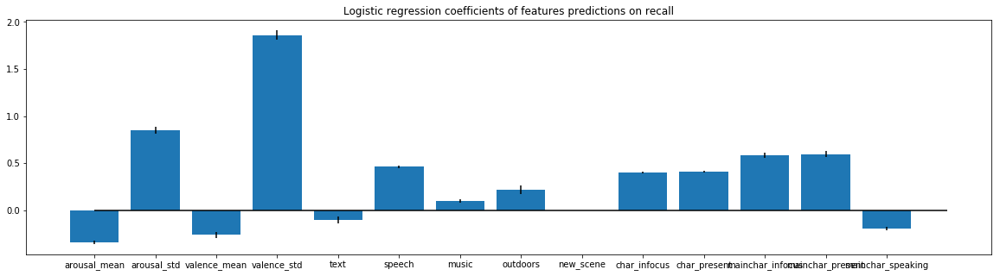

In [141]:
bars = np.array(pred_coefs)[:, 0]
sd = np.array(pred_coefs)[:, 1]
plt.figure(figsize = [20, 5])
plt.bar(range(14), bars)
plt.errorbar(range(14), bars, yerr = sd, linestyle = '', c = 'Black')
plt.hlines(0, 0, 14)
plt.xticks(range(14), features.columns[2:])
plt.title("Logistic regression coefficients of features predictions on recall")

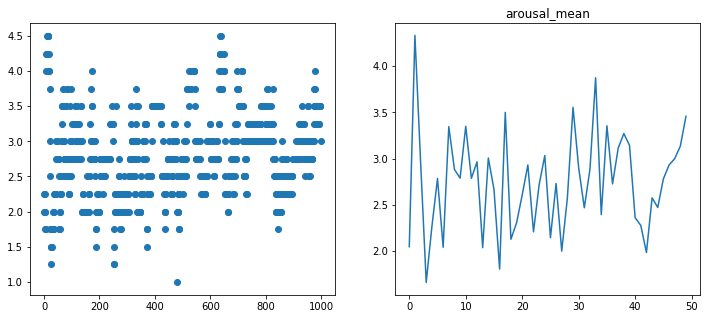

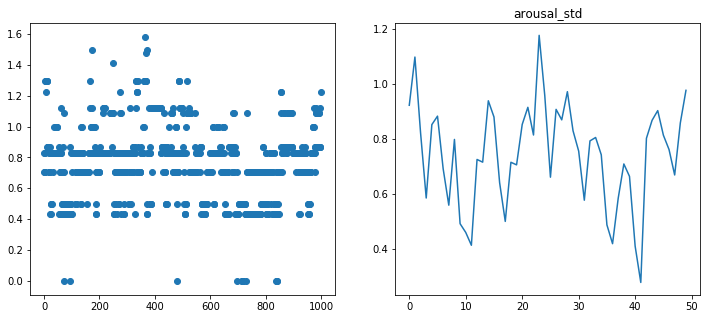

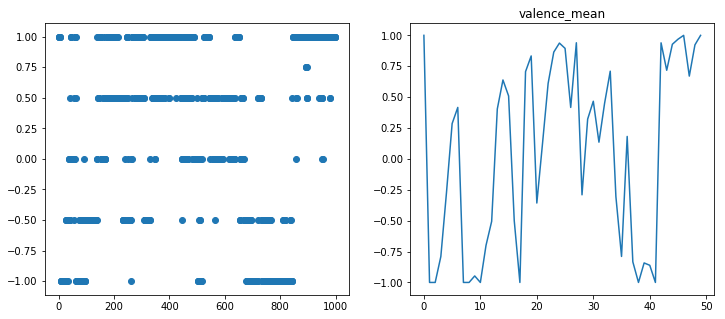

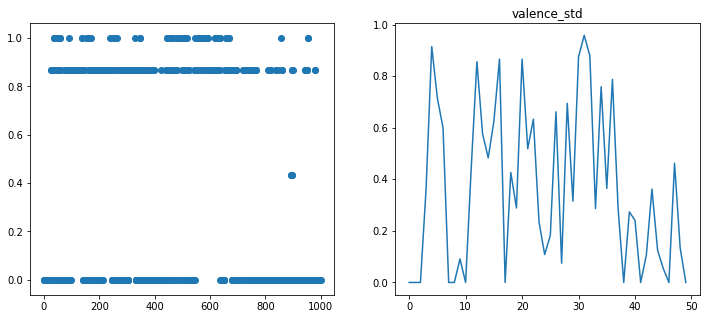

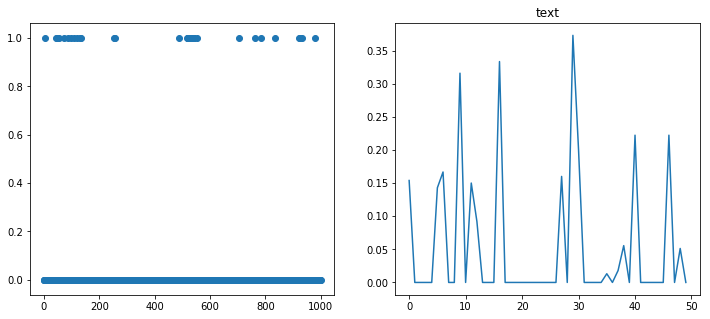

...

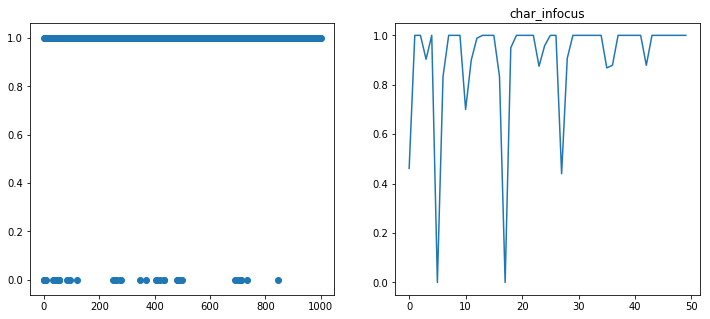

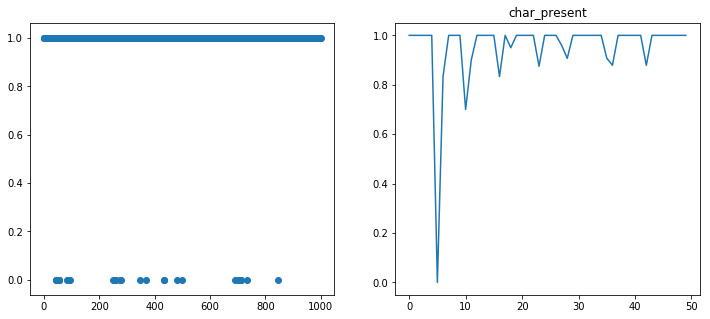

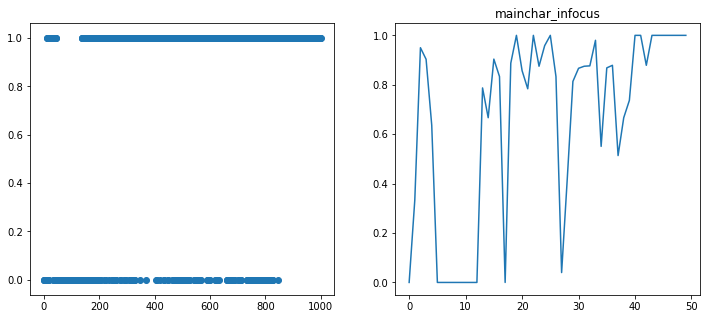

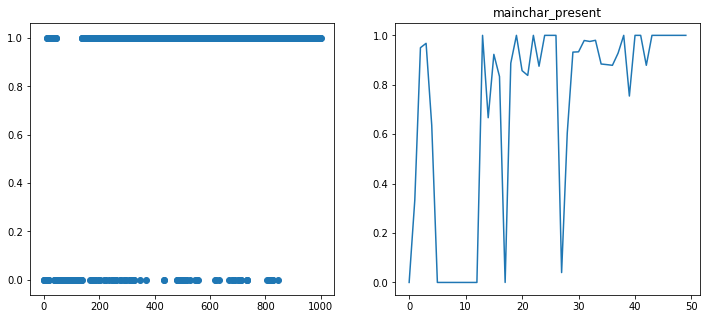

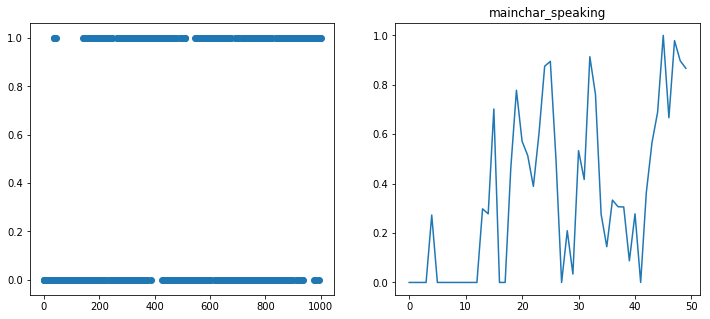

In [78]:
# We want to make sure our feature downsampling function works, first of all...
for feat in range(14):
    fig = plt.figure(figsize=[12, 5])
    ax = fig.add_subplot(1, 2, 1)
    ax.scatter(range(1000), features.loc[:, features.columns[2 + feat]])
    ax = fig.add_subplot(1, 2, 2)
    ax.plot(range(nScenes), np.ravel(scene_voxelavg(np.reshape(expandFeature(features.columns[2 + feat]), [1, -1]), 0)))
    ax.set_title(features.columns[2 + feat])
    
# It works... but keep in mind that there is a LOT of information lost in this process!

In [227]:
features_sc = np.ravel(scene_voxelavg(np.reshape(expandFeature(features.columns[2 + feat]), [1, -1]), 0))

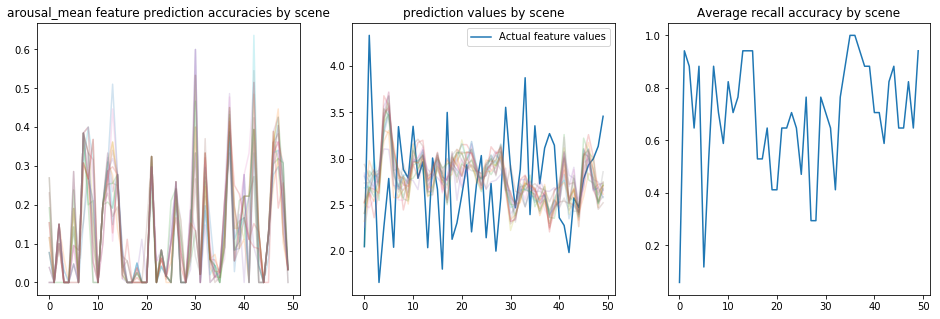

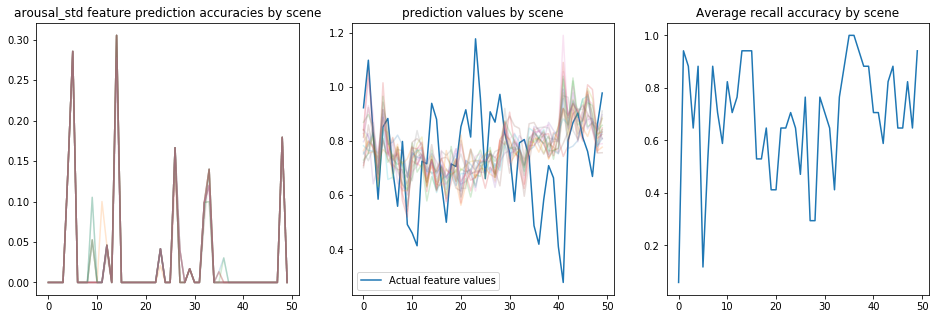

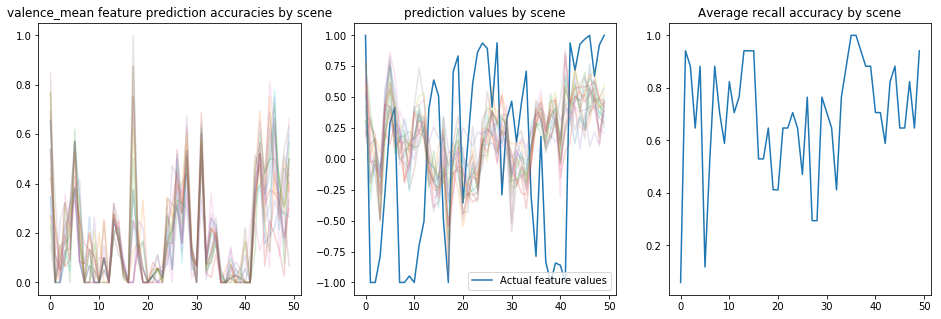

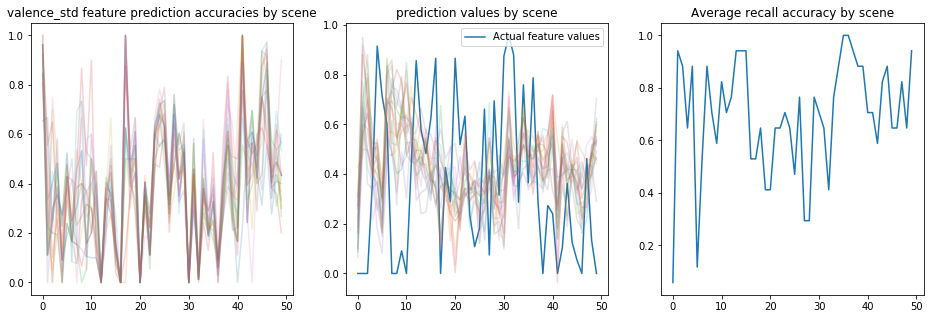

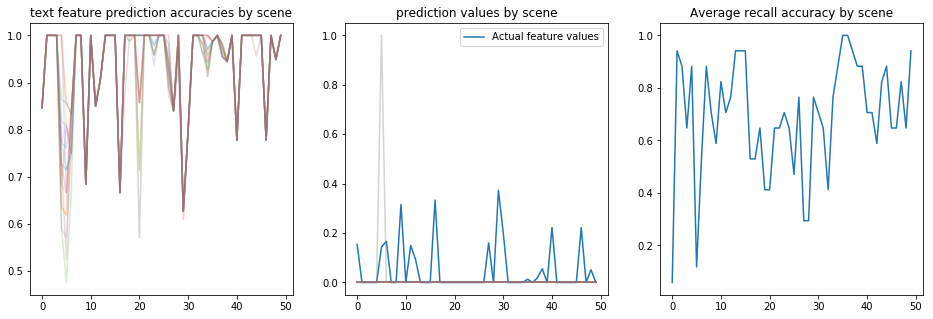

...

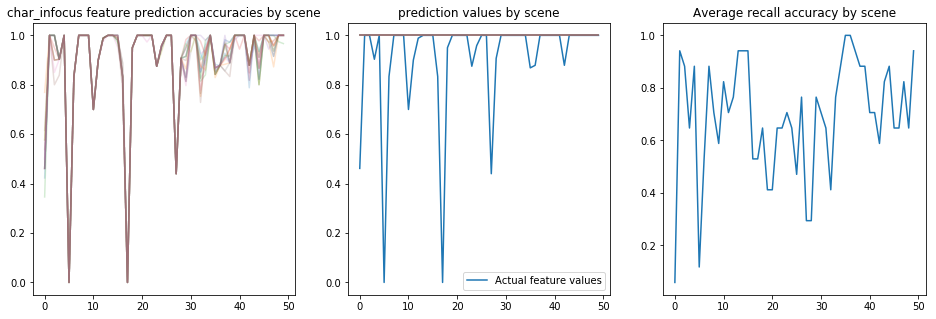

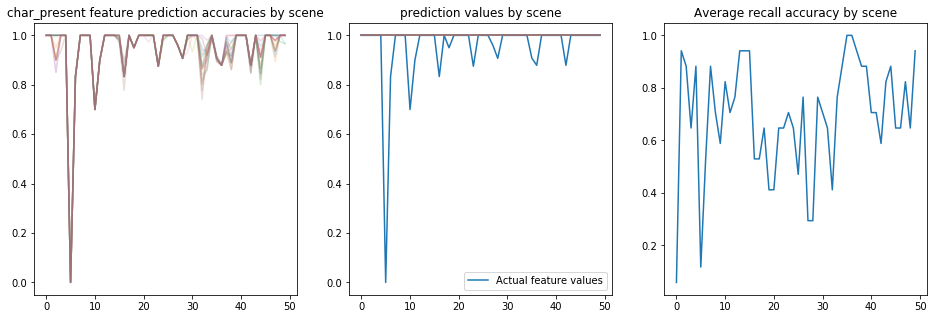

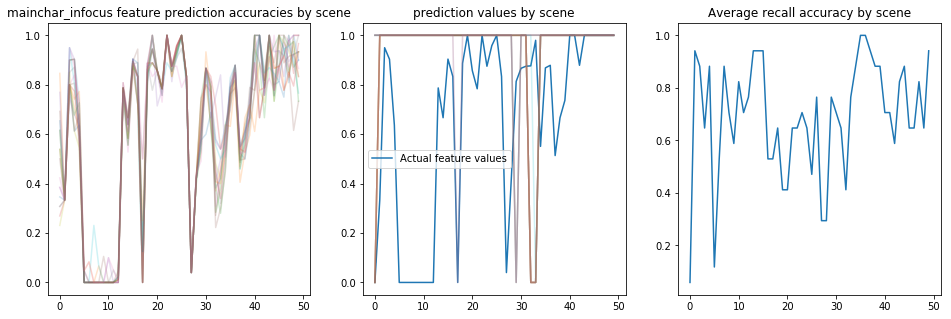

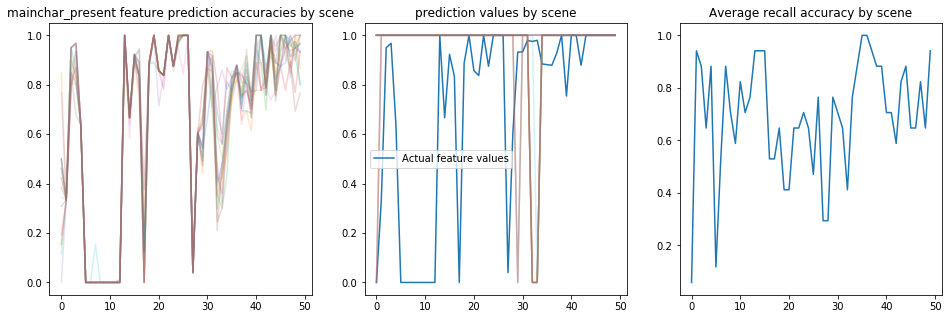

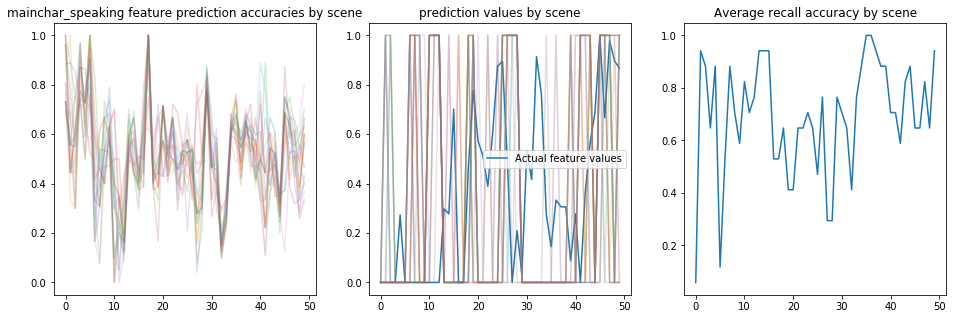

In [81]:
# Again, this time adding in features by scenes
for feat in range(14):
    fig = plt.figure(figsize=[16, 5])
    ax = fig.add_subplot(1, 3, 1)
    ax.set_title(features.columns[feat + 2] + " feature prediction accuracies by scene")
    for pid in range(n):
        ax.plot(range(nScenes), feataccs_byScene[pid, feat, :], alpha = 0.2)
    ax = fig.add_subplot(1, 3, 2)
    ax.set_title("prediction values by scene")
    ax.plot(range(nScenes), np.ravel(scene_voxelavg(np.reshape(expandFeature(features.columns[2 + feat]), [1, -1]), 0)))
    ax.legend(["Actual feature values"])
    for pid in range(n):
        ax.plot(range(nScenes), featmats_sc[pid, feat, :], alpha = 0.2)
    ax = fig.add_subplot(1, 3, 3)
    ax.set_title("Average recall accuracy by scene")
    ax.plot(range(nScenes), recallbyScene)

In [242]:
arousal_std = expandFeature("arousal_std")
valence_std = expandFeature("valence_std")

In [265]:
from scipy.spatial.distance import pdist
avgdiff = []
movie_data_sc = zscore([scene_voxelavg(movie_data[i]) for i in range(n)])
#for TR in range(nTRs1 + nTRs2):
for scene in range(nScenes):
    avgdiff.append(np.mean(pdist(movie_data_sc[:, :, scene])))
    print(avgdiff[scene])

/gpfs/milgram/apps/hpc.rhel7/software/Python/Anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:138: RuntimeWarning: invalid value encountered in sqrt
  ret = um.sqrt(ret, out=ret)
/gpfs/milgram/apps/hpc.rhel7/software/Python/Anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:2251: RuntimeWarning: divide by zero encountered in true_divide
  np.expand_dims(sstd, axis=axis))
/gpfs/milgram/apps/hpc.rhel7/software/Python/Anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:2251: RuntimeWarning: invalid value encountered in true_divide
  np.expand_dims(sstd, axis=axis))


169.1630534380107
234.46815138507097
165.0430647449312
163.2267190801468
182.04858499288852
161.9862919391778
203.17817781253112
214.3989327415174
175.84744092193554
170.3975203338138
220.0692189099677
190.8155569261609
90.09847534118452
151.74161085440542
163.1489153618075
82.62170453875653
258.63283472394
262.56860708450796
94.29611007809281
221.23039795133653
300.24216674429283
161.72513455098783
261.36465271840717
155.78215543106197
65.78543806674412
212.46598667167723
113.35005459863802
191.7771968091173
143.9263610988291
124.5451975991352
262.3261579729729
131.97315497511968
89.3956566049429
118.59760512160506
94.60040764783946
110.0707957079185
178.18585407537597
73.08913819187856
157.2845791957052
137.00197961399616
284.60057268445456
366.4398940193559
167.71114912353823
180.79307615983925
147.12892543864447
271.5970814245029
146.90321112036995
114.72885656111008
158.24750248958645
167.0484728189414


In [275]:
arousal_std_sc = np.ravel(scene_voxelavg(np.reshape(arousal_std, [1, -1]), 0))
valence_std_sc = np.ravel(scene_voxelavg(np.reshape(valence_std, [1, -1]), 0))

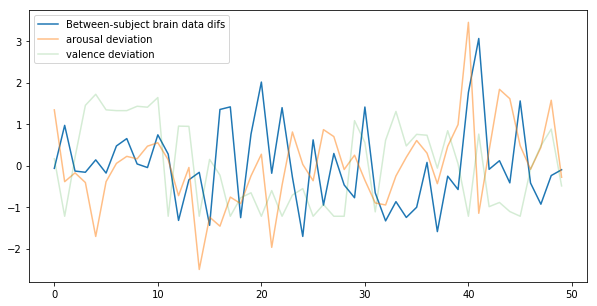

In [281]:
fig = plt.figure(figsize=[10, 5])
plt.plot(range(nScenes), stats.zscore(avgdiff))
plt.plot(range(nScenes), stats.zscore(arousal_std_sc), alpha = 0.5)
plt.plot(range(nScenes), stats.zscore(valence_std_sc), alpha = 0.2)
plt.legend(["Between-subject brain data difs", "arousal deviation", "valence deviation"])
# There is a good amount of correlation between differences between brain data and arousal!

In [286]:
# Try again using TRs and SRM:
srm = brainiak.funcalign.srm.SRM(n_iter = 10, features = 50)
srm.fit(zscore(movie_data))
shared_data = np.array(srm.transform(movie_data))

avgdiffs_TR = []
for TR in range(nTRs1 + nTRs2):
    avgdiffs_TR.append(np.mean(pdist(shared_data[:, :, TR])))
    if (TR == 500):
        print("TR 500 computed")

/gpfs/milgram/apps/hpc.rhel7/software/Python/Anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:138: RuntimeWarning: invalid value encountered in sqrt
  ret = um.sqrt(ret, out=ret)
/gpfs/milgram/apps/hpc.rhel7/software/Python/Anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:2251: RuntimeWarning: divide by zero encountered in true_divide
  np.expand_dims(sstd, axis=axis))
/gpfs/milgram/apps/hpc.rhel7/software/Python/Anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:2251: RuntimeWarning: invalid value encountered in true_divide
  np.expand_dims(sstd, axis=axis))


TR 500 computed


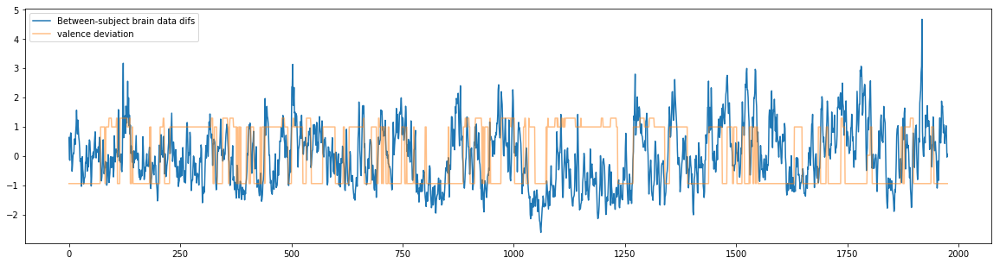

In [293]:
fig = plt.figure(figsize=[20, 5])
plt.plot(range(nTRs1 + nTRs2), stats.zscore(avgdiffs_TR))
plt.plot(range(nTRs1 + nTRs2), stats.zscore(valence_std), alpha = 0.5)
plt.legend(["Between-subject brain data difs", "valence deviation"])

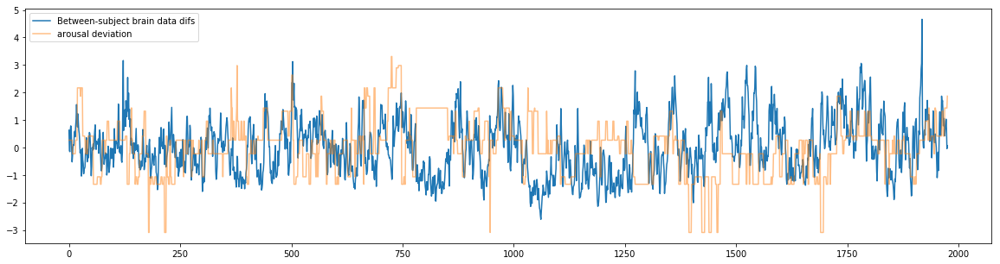

In [292]:
fig = plt.figure(figsize=[20, 5])
plt.plot(range(nTRs1 + nTRs2), stats.zscore(avgdiffs_TR))
plt.plot(range(nTRs1 + nTRs2), stats.zscore(arousal_std), alpha = 0.5)
plt.legend(["Between-subject brain data difs", "arousal deviation"])

In [295]:
np.random.choice([12,3 ,4,5], 4)

array([4, 3, 5, 5])

In [300]:
# ok, clearly we can't predict recall by a single feature prediction or feature accuracy
# so let's try using all of them
np.shape(featmats_sc), np.shape(feat_accs_sc)

((17, 14, 50), (17, 14, 1976))

In [157]:
def flatdat(dat):
    flat = dat[0]
    for i in range(1, len(dat)):
        flat = np.append(flat, dat[i], axis = 1)
    return np.array(flat.T)

def predictRecall_allfeats(pid, X, classifier = svm.SVC()): # X either participants' feature preds or pred accuracies
    train_pids = [i for i in range(n) if i != pid]
    test_pids = [pid]
    
    ytrain = np.ravel(recall_dfs[train_pids, :, 0])
    ytest = np.ravel(recall_dfs[test_pids, :, 0])
    
    # for each time period, a row of all feature prediction values 
    xtrain = flatdat(X[train_pids])
    xtest = flatdat(X[test_pids])
    
    classifier.fit(xtrain, ytrain)
    preds = classifier.predict(xtest)
    return np.mean(preds == ytest)

def nullRecall_allfeats(pid, X, classifier = svm.SVC()): # X either participants' feature preds or pred accuracies
    train_pids = [i for i in range(n) if i != pid]
    test_pids = [pid]
    
    ytrain = np.ravel(recall_dfs[train_pids, :, 0])
    ytrain = np.random.choice(ytrain, len(ytrain))
    ytest = np.ravel(recall_dfs[test_pids, :, 0])
    
    # for each time period, a row of all feature prediction values 
    xtrain = flatdat(X[train_pids])
    xtest = flatdat(X[test_pids])
    
    classifier.fit(xtrain, np.reshape(ytrain, [-1, 1]))
    preds = classifier.predict(xtest)
    return np.mean(preds == ytest)

In [165]:
feataccs_sc = np.array([scene_voxelavg(feat_accs_sc[i], 0) for i in range(n)])

preds = []
nullpreds = []
for pid in range(n):
    classifier = KNeighborsClassifier()
    preds.append(predictRecall_allfeats(pid, feataccs_sc, classifier))
    nullpreds.append(nullRecall_allfeats(pid, feataccs_sc, classifier))
    print(pid, preds[pid], nullpreds[pid])

stats.ttest_rel(preds, nullpreds)

0 0.72 0.54
1 0.62 0.56
2 0.7 0.54
3 0.68 0.68
4 0.66 0.54
5 0.72 0.64
6 0.64 0.56
7 0.58 0.72
8 0.56 0.46
9 0.82 0.68
10 0.72 0.64
11 0.64 0.66
12 0.78 0.72
13 0.78 0.6
14 0.48 0.52
15 0.7 0.72
16 0.78 0.78


/gpfs/milgram/apps/hpc.rhel7/software/Python/Anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Ttest_relResult(statistic=2.837715908780751, pvalue=0.011879032642407148)

In [160]:
np.shape(feataccs_sc), np.shape(feat_accs_sc)

((17, 14, 50), (17, 14, 1976))

In [213]:
recallbyScene = [np.mean(recall_dfs[:, i, 0]) for i in range(nScenes)]

In [214]:
def predictAVGRecall(pid, X, classifier = svm.SVR()): # X either participants' feature preds or pred accuracies
    train_pids = [i for i in range(n) if i != pid]
    test_pids = [pid]
    
    ytrain =  recallbyScene * len(train_pids)
    ytest = recallbyScene
    
    # for each time period, a row of all feature prediction values 
    xtrain = flatdat(X[train_pids])
    xtest = flatdat(X[test_pids])
    
    classifier.fit(xtrain, ytrain)
    preds = classifier.predict(xtest)
    return preds

def nullAVGRecall(pid, X, classifier = svm.SVR()): # X either participants' feature preds or pred accuracies
    train_pids = [i for i in range(n) if i != pid]
    test_pids = [pid]
    
    ytrain = recallbyScene * len(train_pids)
    ytrain = np.random.choice(ytrain, len(ytrain), replace = False)
    ytest = recallbyScene
    
    # for each time period, a row of all feature prediction values 
    xtrain = flatdat(X[train_pids])
    xtest = flatdat(X[test_pids])
    
    classifier.fit(xtrain, ytrain)
    preds = classifier.predict(xtest)
    return preds

Average recall predictions using participant feature predictions


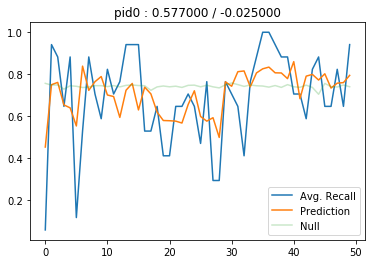

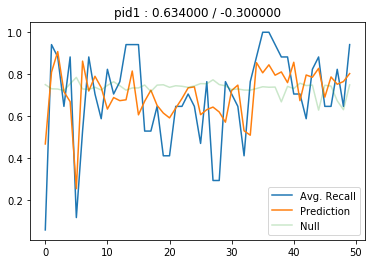

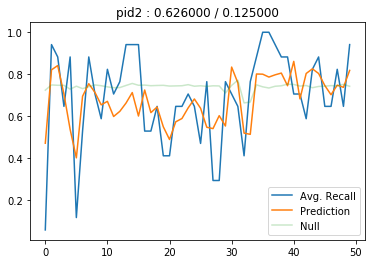

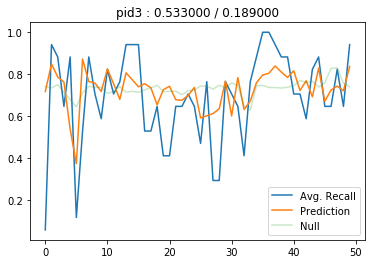

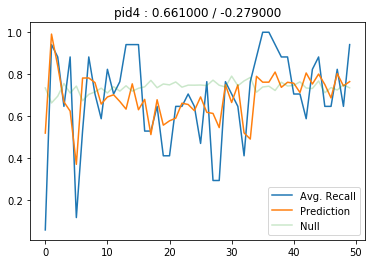

...

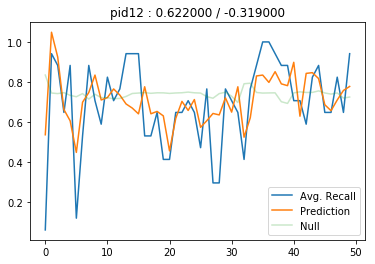

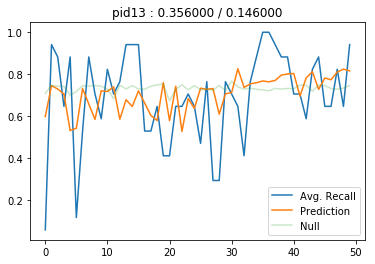

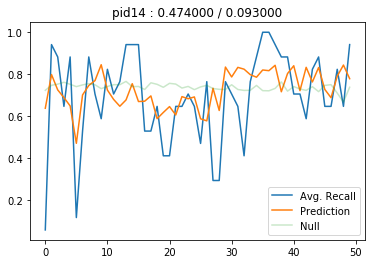

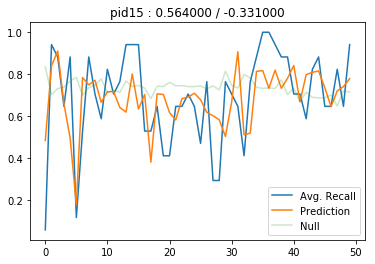

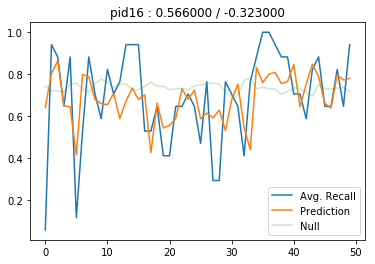

In [227]:
print("Average recall predictions using participant feature predictions")
avgres = []
nullres = []
for pid in range(n):
    classifier = svm.SVR()
    fig = plt.figure()
    plt.plot(recallbyScene)
    recallPreds = predictAVGRecall(pid, featmats_sc, classifier)
    plt.plot(recallPreds)
    predcor = np.round(np.corrcoef(recallbyScene, recallPreds)[0, 1], 3)
    avgres.append(predcor)
    
    nullPreds = nullAVGRecall(pid, featmats_sc, classifier)
    plt.plot(nullPreds, alpha = 0.25)
    nullcor = np.round(np.corrcoef(recallbyScene, nullPreds)[0, 1], 3)
    plt.legend(["Avg. Recall", "Prediction", "Null"])
    nullres.append(nullcor)
    plt.title("pid%d : %f / %f" % (pid, predcor, nullcor))

In [222]:
stats.ttest_rel(avgres, nullres)

Ttest_relResult(statistic=11.01783107219122, pvalue=7.016281071149445e-09)

In [224]:
np.shape(feataccs_sc)

(17, 14, 50)

Average recall predictions using participant feature prediction accuracies


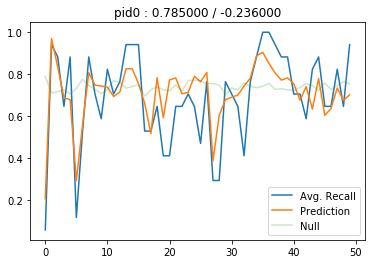

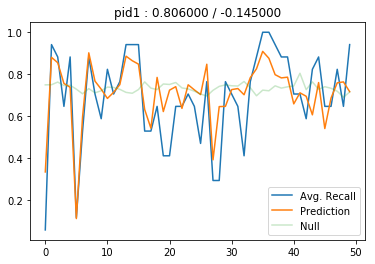

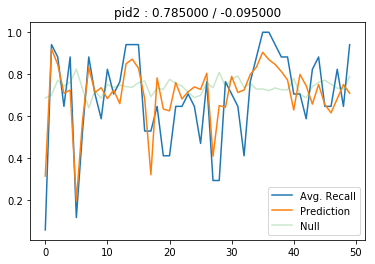

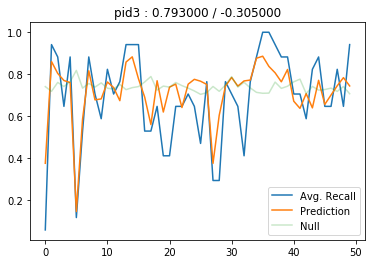

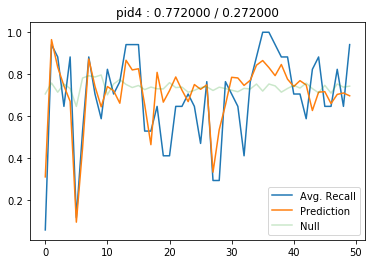

...

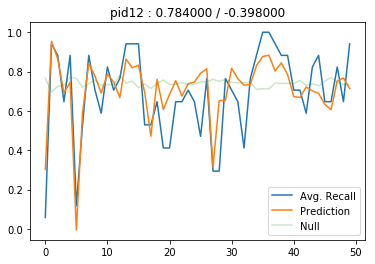

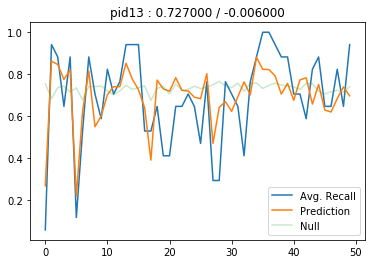

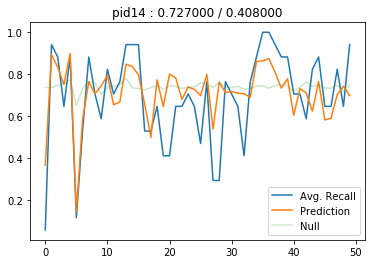

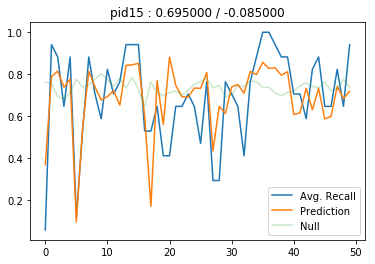

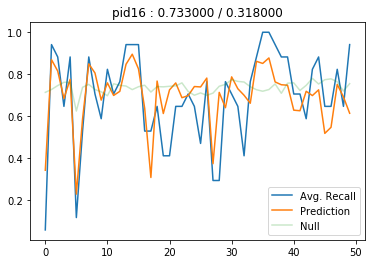

In [225]:
print("Average recall predictions using participant feature prediction accuracies")
avgres = []
nullres = []
for pid in range(n):
    classifier = svm.SVR()
    fig = plt.figure()
    plt.plot(recallbyScene)
    recallPreds = predictAVGRecall(pid, feataccs_sc, classifier)
    plt.plot(recallPreds)
    predcor = np.round(np.corrcoef(recallbyScene, recallPreds)[0, 1], 3)
    avgres.append(predcor)
    
    nullPreds = nullAVGRecall(pid, feataccs_sc, classifier)
    plt.plot(nullPreds, alpha = 0.25)
    nullcor = np.round(np.corrcoef(recallbyScene, nullPreds)[0, 1], 3)
    plt.legend(["Avg. Recall", "Prediction", "Null"])
    nullres.append(nullcor)
    plt.title("pid%d : %f / %f" % (pid, predcor, nullcor))

In [226]:
stats.ttest_rel(avgres, nullres)

Ttest_relResult(statistic=12.408414128513432, pvalue=1.2650221932701614e-09)

In [228]:
def predictRecallQ_allfeats(pid, X, classifier = svm.SVR()): # X either participants' feature preds or pred accuracies
    train_pids = [i for i in range(n) if i != pid]
    test_pids = [pid]
    
    ytrain = np.ravel(recall_dfs[train_pids, :, 1])
    ytest = np.ravel(recall_dfs[test_pids, :, 1])
    
    # for each time period, a row of all feature prediction values 
    xtrain = flatdat(X[train_pids])
    xtest = flatdat(X[test_pids])
    
    classifier.fit(xtrain, ytrain)
    preds = classifier.predict(xtest)
    return preds

def nullRecallQ_allfeats(pid, X, classifier = svm.SVR()): # X either participants' feature preds or pred accuracies
    train_pids = [i for i in range(n) if i != pid]
    test_pids = [pid]
    
    ytrain = np.ravel(recall_dfs[train_pids, :, 1])
    ytrain = np.random.choice(ytrain, len(ytrain), replace = False)
    ytest = np.ravel(recall_dfs[test_pids, :, 1])
    
    # for each time period, a row of all feature prediction values 
    xtrain = flatdat(X[train_pids])
    xtest = flatdat(X[test_pids])
    
    classifier.fit(xtrain, ytrain)
    preds = classifier.predict(xtest)
    return preds

Predictions of recall quality by feature predictions


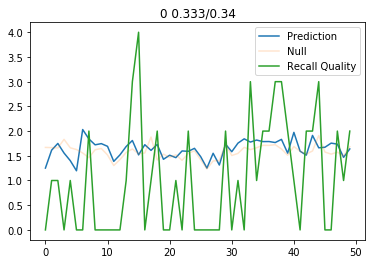

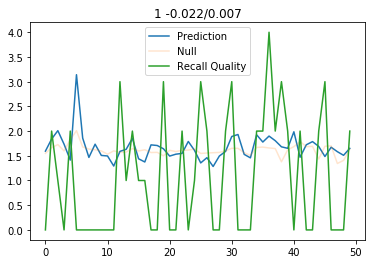

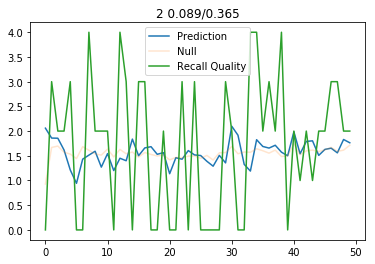

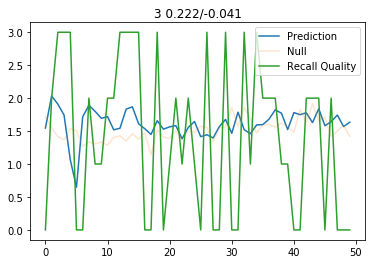

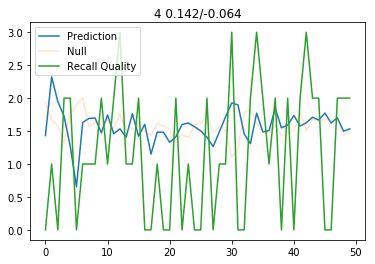

...

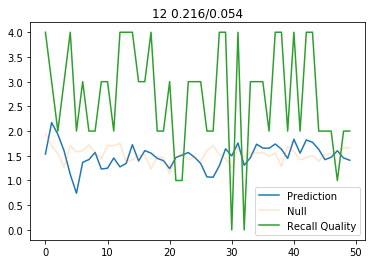

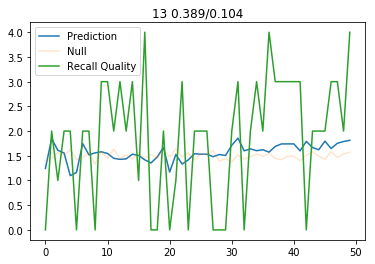

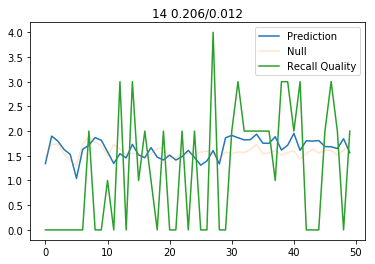

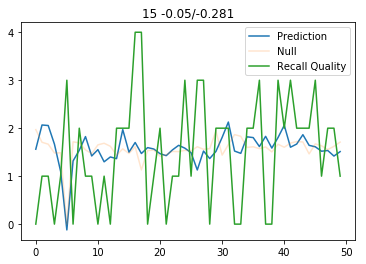

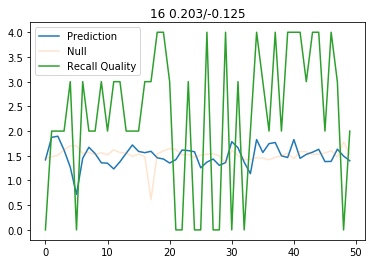

In [235]:
print("Predictions of recall quality by feature predictions")

RQcors = []
RQnullcors = []
for pid in range(n):
    classifier = linear_model.LinearRegression()
    Y = recall_dfs[pid, :, 1]
    plt.figure()
    RQpred = predictRecallQ_allfeats(pid, featmats_sc, classifier)
    RQcors.append(np.round(np.corrcoef(RQpred, Y)[0, 1], 3))
    plt.plot(RQpred)
    
    RQnull = nullRecallQ_allfeats(pid, featmats_sc, classifier)
    RQnullcors.append(np.round(np.corrcoef(RQnull, Y)[0, 1], 3))
    plt.plot(RQnull, alpha = 0.2)
    plt.plot(Y)
    plt.legend(["Prediction", "Null", "Recall Quality"])
    plt.title(str(pid) + " " + str(RQcors[pid]) + "/" + str(RQnullcors[pid]))

Predictions of recall quality by feature accuracies


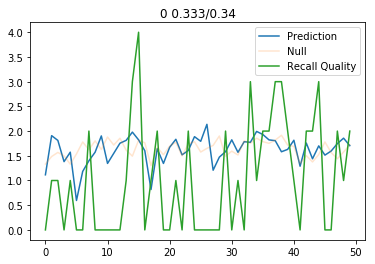

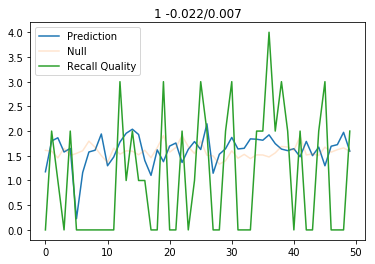

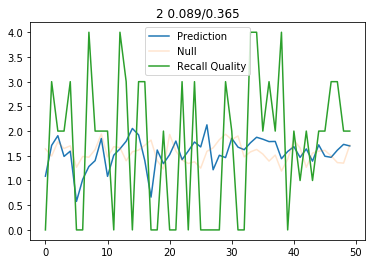

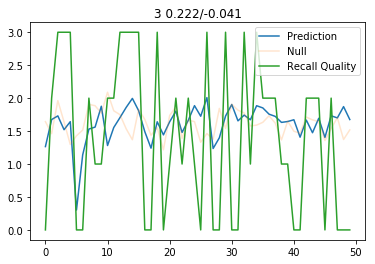

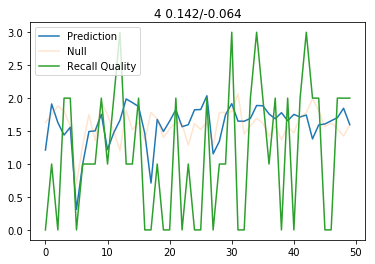

...

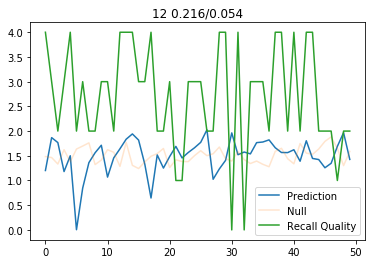

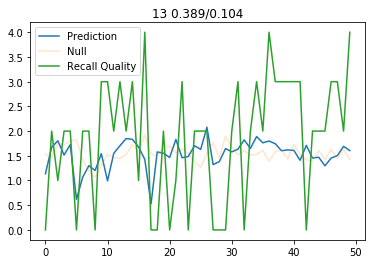

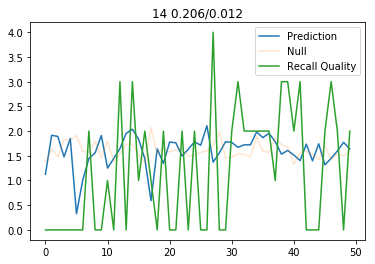

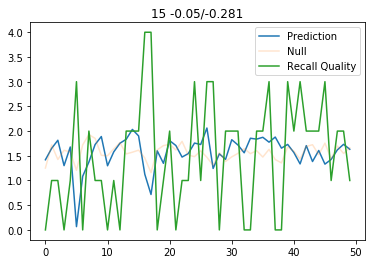

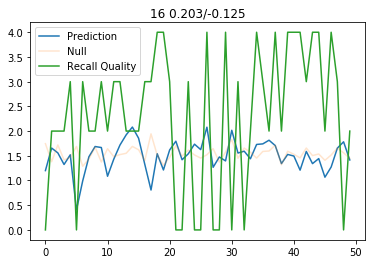

In [237]:
print("Predictions of recall quality by feature accuracies")
RQcors_acc = []
RQnullcors_acc = []
for pid in range(n):
    classifier = linear_model.LinearRegression()
    Y = recall_dfs[pid, :, 1]
    plt.figure()
    RQpred = predictRecallQ_allfeats(pid, feataccs_sc, classifier)
    RQcors_acc.append(np.round(np.corrcoef(RQpred, Y)[0, 1], 3))
    plt.plot(RQpred)
    
    RQnull = nullRecallQ_allfeats(pid, feataccs_sc, classifier)
    RQnullcors_acc.append(np.round(np.corrcoef(RQnull, Y)[0, 1], 3))
    plt.plot(RQnull, alpha = 0.2)
    plt.plot(Y)
    plt.legend(["Prediction", "Null", "Recall Quality"])
    plt.title(str(pid) + " " + str(RQcors[pid]) + "/" + str(RQnullcors[pid]))

In [240]:
stats.ttest_rel(RQcors, RQnullcors)

Ttest_relResult(statistic=2.044226151644331, pvalue=0.05775075149239979)

In [241]:
stats.ttest_rel(RQcors_acc, RQnullcors_acc)

Ttest_relResult(statistic=5.022123381868155, pvalue=0.00012516015916648658)